Изучение обучения трансформера регрессии

Попробуем делать разные операции со слоями трансформера и смотреть как это влияет на его обучение.

In [1]:
import torch
import matplotlib.pyplot as plt
%config InlineBackend.figure_format='retina'
from configurations import build_conf
from clean_logs_tool import clean_dirs_by_name


device = 'cuda' if torch.cuda.is_available() else 'cpu'


from quinine import Quinfig
from schema import schema
from experiments import Experiment


config_path = './configs/main.yaml'  # specify your config file path here

conf = Quinfig(config_path=config_path, schema=schema)
conf = build_conf(conf)


Experiment.yaml_experiment_info(conf)

"""
Выведем дефолтные конфигурации эксперимента
По умолчанию transform_func и auto_transform_func это первые элементы списков transform_variants и auto_transform_variants
transform преобразования делают измененную копию модели, для нее строится 2 график каждый eval цикл, обычно копия модели не учится
auto transform меняет основную модель - нас интересует перемешивание слоев, но можно делать и другие любые преобразования
"""





Running experiment with params:
    log_model_weights: True
    transform_conf:
        switch_params: None
        duplicate_params: [1, 3, 1]
        slice_params: [1, 3]
        full_backbone_copy: False
        no_layernorm_full_backbone_copy: False
        first_n_layers: None
        new_backbone_training: False
        diverge_new_backbone_training: False
        readout2_training: False
        clear_readout2: False
        model_variants: ['modified', 'full_backbone + no_final_layer_norm']
        transform_choice: 1
        transform_variants: ['duplicate_layers', 'switch_layers', 'slice_layers']
        transform_func: <function variant.<locals>.decorator.<locals>.wrapper at 0x0000020247061E50>
    auto_transform_conf:
        permute_bounds_params: [1, 3]
        permute_interval: 10
        permute_model: False
        auto_transform_choice: 1
        auto_transform_variants: ['auto_permute_layers', 'auto_custom_permute']
        use_custom_permute: False
        auto_tran

'\nВыведем дефолтные конфигурации эксперимента\nПо умолчанию transform_func и auto_transform_func это первые элементы списков transform_variants и auto_transform_variants\ntransform преобразования делают измененную копию модели, для нее строится 2 график каждый eval цикл, обычно копия модели не учится\nauto transform меняет основную модель - нас интересует перемешивание слоев, но можно делать и другие любые преобразования\n'

Эксперимент без модификаций, лосс одинаковый слева и справа

Deleted directory: .\exp_models\linear_regression\checkpoints\baseline
Deleted directory: .\exp_models\linear_regression\plots\baseline
Running experiment with params:
    log_model_weights: True
    transform_conf:
        switch_params: None
        duplicate_params: [1, 6, 1]
        full_backbone_copy: False
        no_layernorm_full_backbone_copy: False
        first_n_layers: None
        new_backbone_training: False
        readout2_training: False
        model_variants: ['modified', 'full_backbone + no_final_layer_norm']
        transform_variants: ['duplicate_layers', 'switch_layers']
        transform_func: <function variant.<locals>.decorator.<locals>.wrapper at 0x00000171AEA3B820>
    auto_transform_conf:
        permute_bounds_params: [1, 6]
        permute_interval: 10
        permute_model: False
        auto_transform_variants: ['auto_permute_layers', 'auto_custom_permute']
        use_custom_permute: False
        auto_transform_func: <function variant.<locals>.decora

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


17.682946 M parameters


wandb: Currently logged in as: enemo_ce-warch (use `wandb login --relogin` to force relogin)


''

step 0: train loss 5.1706, train loss 2 5.1706
step 200: train loss 4.7601, train loss 2 4.7601
step 400: train loss 5.1627, train loss 2 5.1627


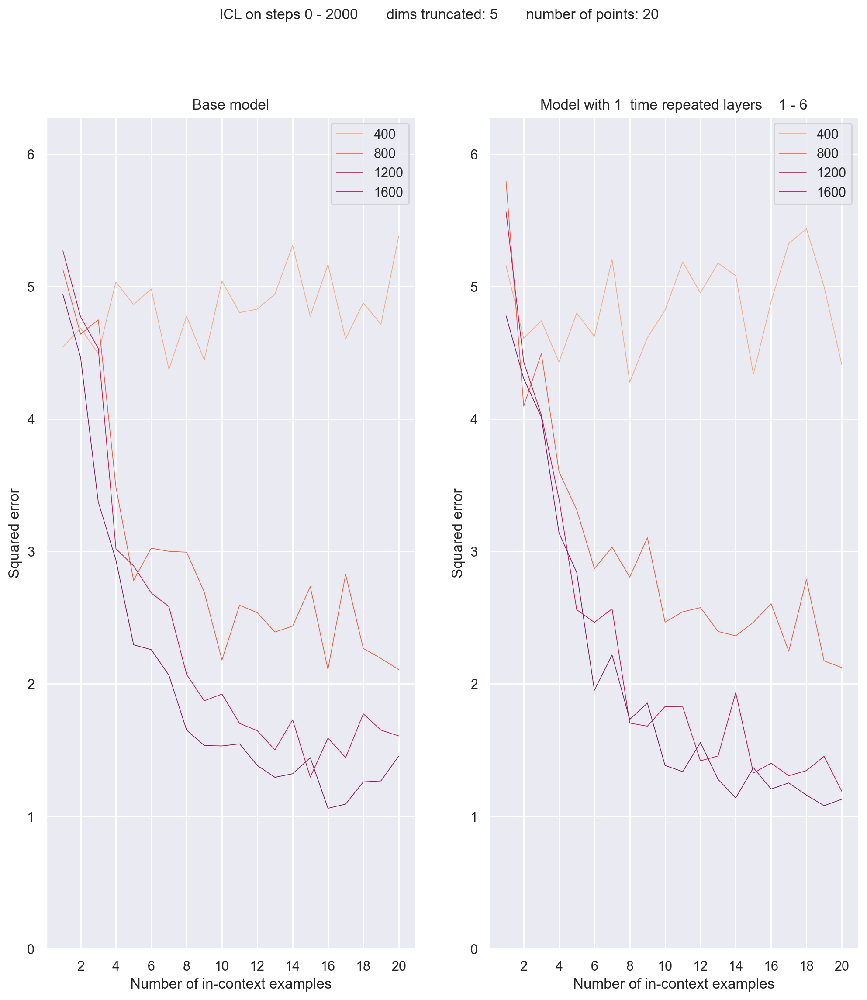

step 600: train loss 4.1588, train loss 2 4.1588
step 800: train loss 2.8178, train loss 2 2.8178
step 1000: train loss 2.4845, train loss 2 2.4845
step 1200: train loss 2.2597, train loss 2 2.2597
step 1400: train loss 2.1053, train loss 2 2.1053
step 1600: train loss 1.9190, train loss 2 1.9190
step 1800: train loss 1.9436, train loss 2 1.9436
step 2000: train loss 1.7966, train loss 2 1.7966


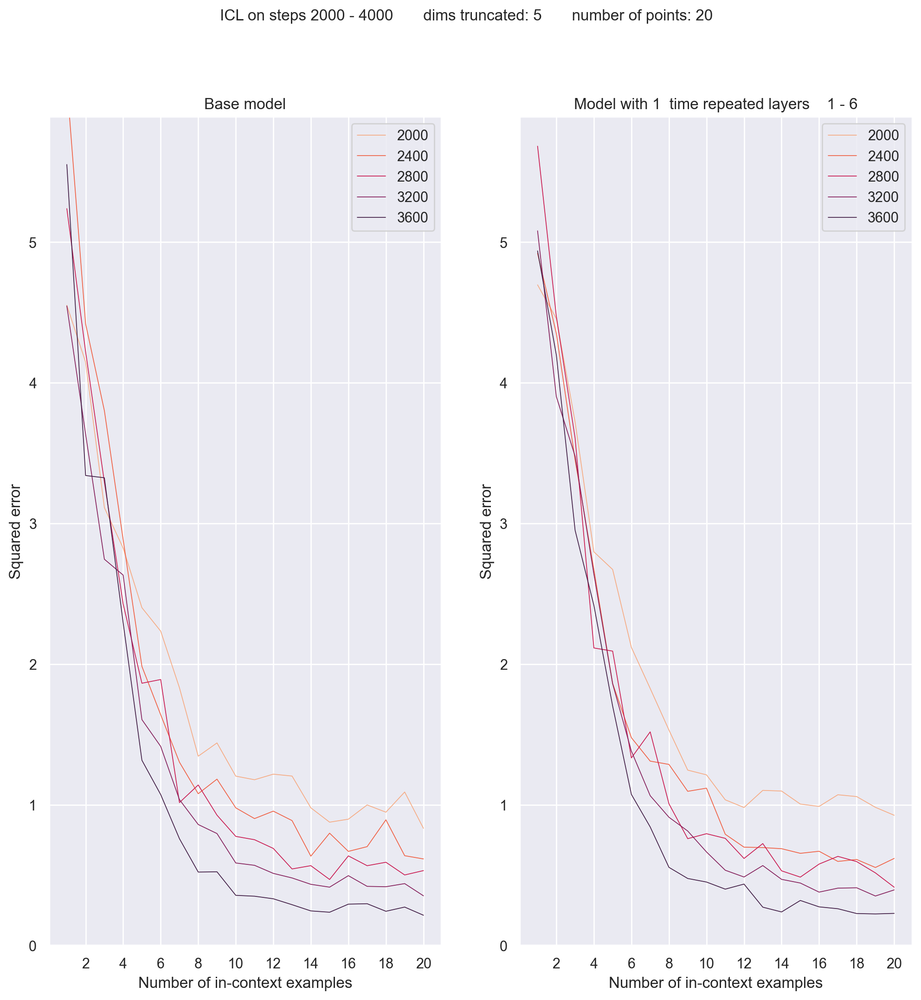

step 2200: train loss 1.6348, train loss 2 1.6348
step 2400: train loss 1.5289, train loss 2 1.5289
step 2600: train loss 1.4392, train loss 2 1.4392
step 2800: train loss 1.3261, train loss 2 1.3261
step 3000: train loss 1.3613, train loss 2 1.3613
step 3200: train loss 1.2887, train loss 2 1.2887
step 3400: train loss 1.2059, train loss 2 1.2059
step 3600: train loss 1.0918, train loss 2 1.0918
step 3800: train loss 1.1165, train loss 2 1.1165
step 4000: train loss 1.0465, train loss 2 1.0465


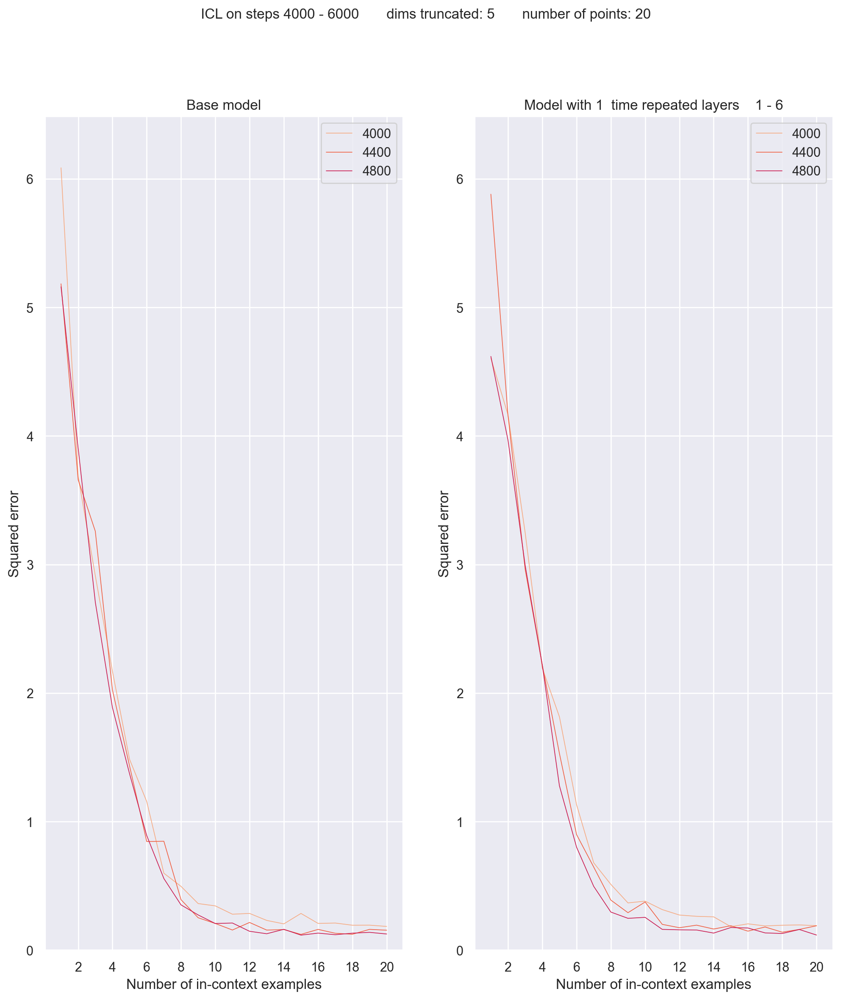

step 4200: train loss 0.9819, train loss 2 0.9819
step 4400: train loss 0.9983, train loss 2 0.9983
step 4600: train loss 0.9459, train loss 2 0.9459
step 4800: train loss 0.9945, train loss 2 0.9945
step 4999: train loss 0.9157, train loss 2 0.9157


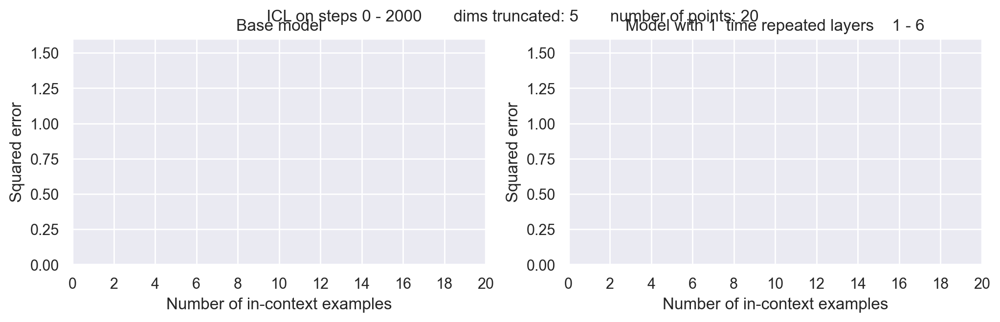

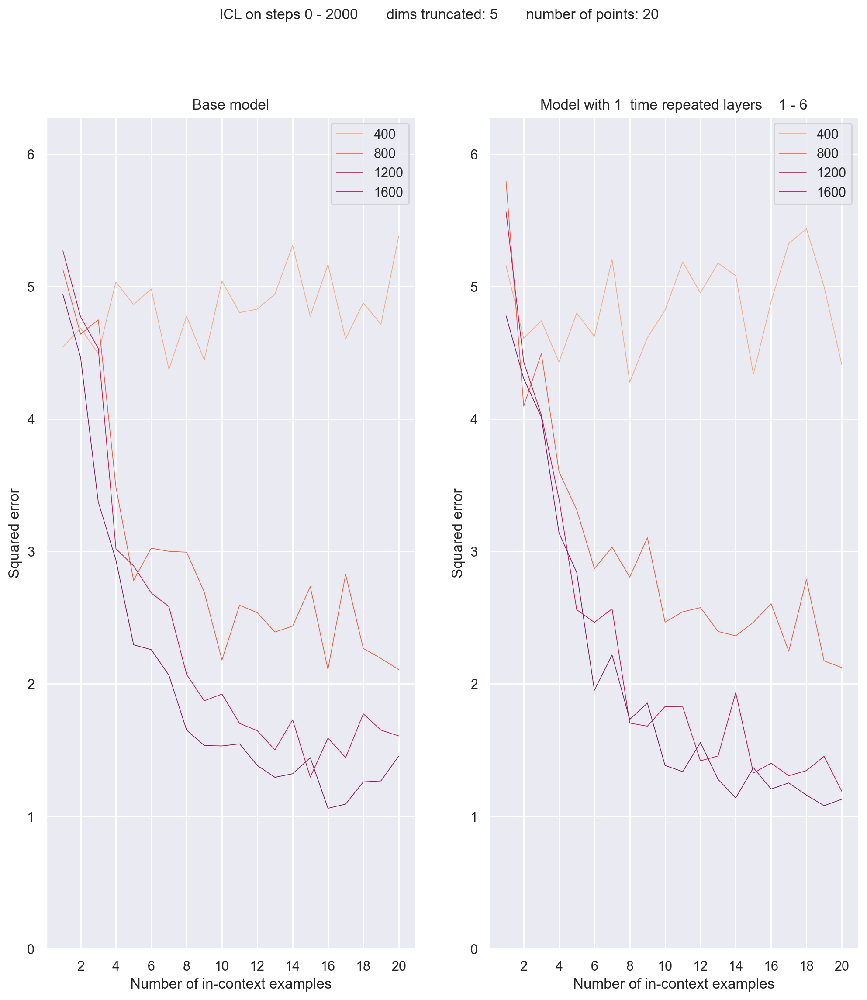

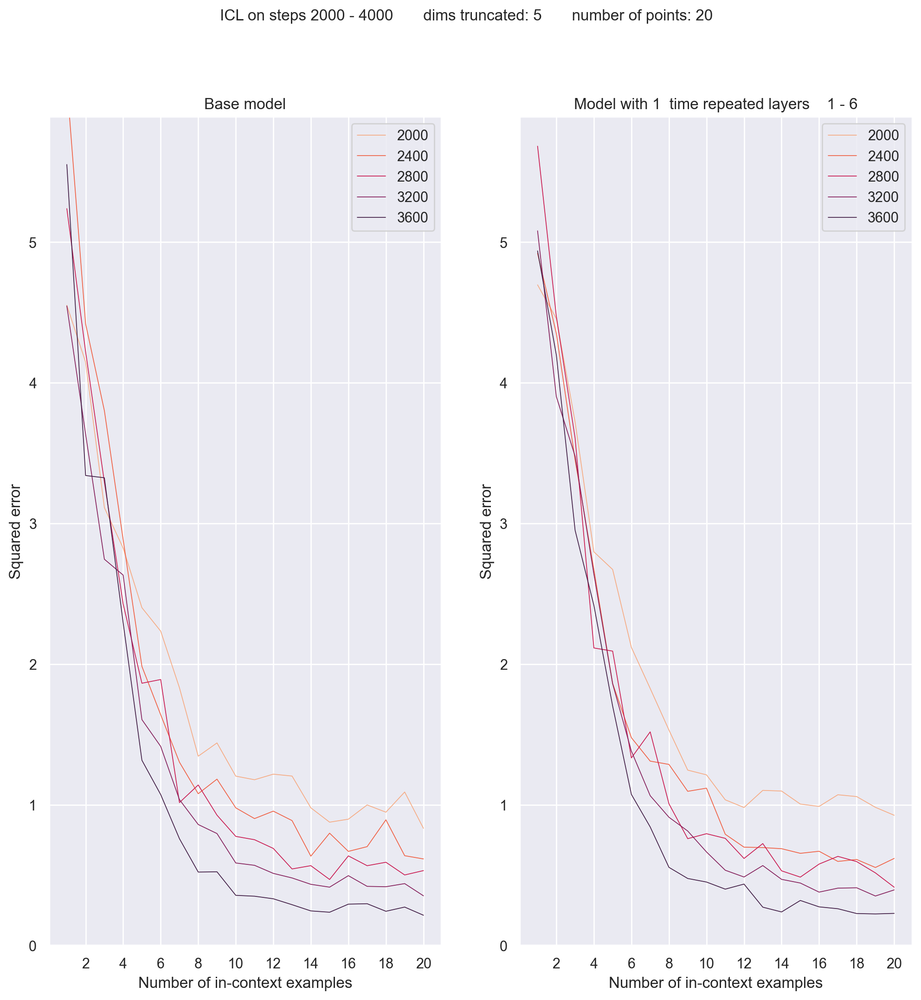

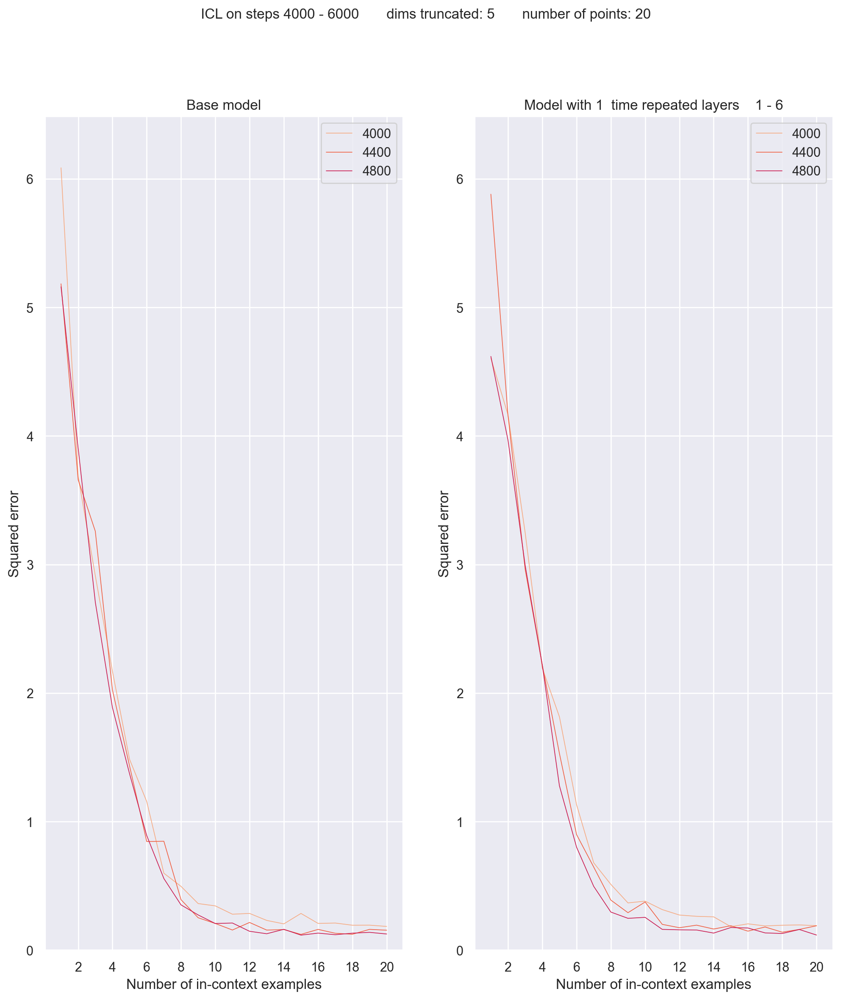

In [2]:
clean_dirs_by_name(conf.out_dir, 'baseline')   
#используйте, чтобы чистить директории
exp1 = Experiment(conf, short_name = 'baseline')
exp1.run_experiment()


Видно, что трансформер учится.
Попробуем мешать слои каждые 10 итераций
Это покажет, что регрессию трансформер может решать с любым порядком слоев.
Нет 'кодирующих' и 'декодирующих' слоев как в модели статьи.

Running experiment with params:
    log_model_weights: True
    transform_conf:
        switch_params: None
        duplicate_params: [1, 6, 1]
        full_backbone_copy: False
        no_layernorm_full_backbone_copy: False
        first_n_layers: None
        new_backbone_training: False
        readout2_training: False
        model_variants: ['modified', 'full_backbone + no_final_layer_norm']
        transform_variants: ['duplicate_layers', 'switch_layers']
        transform_func: <function variant.<locals>.decorator.<locals>.wrapper at 0x00000241B944D0D0>
    auto_transform_conf:
        permute_bounds_params: [1, 6]
        permute_interval: 10
        permute_model: True
        auto_transform_variants: ['auto_permute_layers', 'auto_custom_permute']
        use_custom_permute: False
        auto_transform_func: <function variant.<locals>.decorator.<locals>.wrapper at 0x00000241B9534F70>
    short_description: permute_baseline


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


17.682946 M parameters


wandb: Currently logged in as: enemo_ce-warch (use `wandb login --relogin` to force relogin)


''

step 0: train loss 5.1564, train loss 2 5.1564


wandb: WARNING Step must only increase in log calls.  Step 0 < 201; dropping {'loss1': tensor(5.1564), 'loss2': tensor(5.1564)}.


step 200: train loss 4.9536, train loss 2 4.9536


wandb: WARNING Step must only increase in log calls.  Step 200 < 201; dropping {'loss1': tensor(4.9536), 'loss2': tensor(4.9536)}.


step 400: train loss 5.1288, train loss 2 5.1288


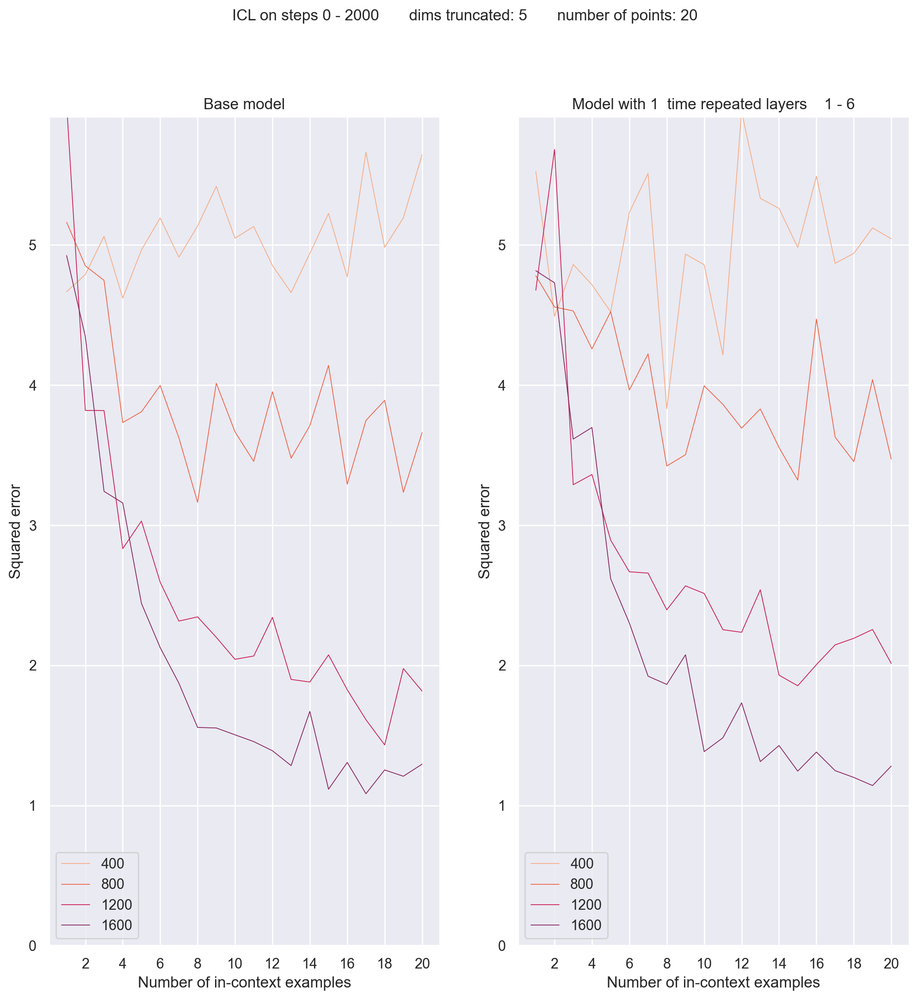

step 600: train loss 4.8461, train loss 2 4.8461
step 800: train loss 3.8710, train loss 2 3.8710
step 1000: train loss 2.9011, train loss 2 2.9011
step 1200: train loss 2.5828, train loss 2 2.5828
step 1400: train loss 2.3843, train loss 2 2.3843
step 1600: train loss 2.0756, train loss 2 2.0756
step 1800: train loss 1.8137, train loss 2 1.8137
step 2000: train loss 1.5546, train loss 2 1.5546


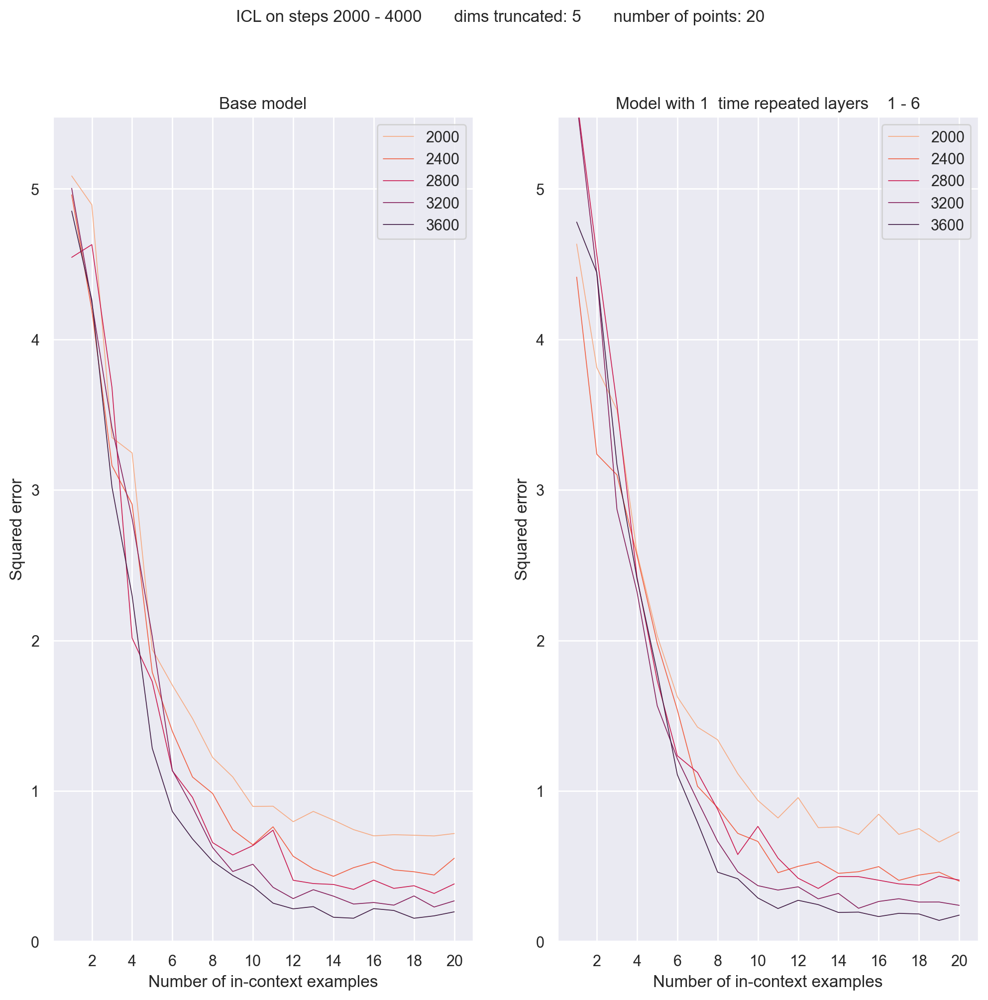

step 2200: train loss 1.4205, train loss 2 1.4205
step 2400: train loss 1.3485, train loss 2 1.3485
step 2600: train loss 1.3177, train loss 2 1.3177
step 2800: train loss 1.1958, train loss 2 1.1958
step 3000: train loss 1.1622, train loss 2 1.1622
step 3200: train loss 1.1601, train loss 2 1.1601
step 3400: train loss 1.1469, train loss 2 1.1469
step 3600: train loss 1.0463, train loss 2 1.0463
step 3800: train loss 1.0986, train loss 2 1.0986
step 4000: train loss 1.0333, train loss 2 1.0333


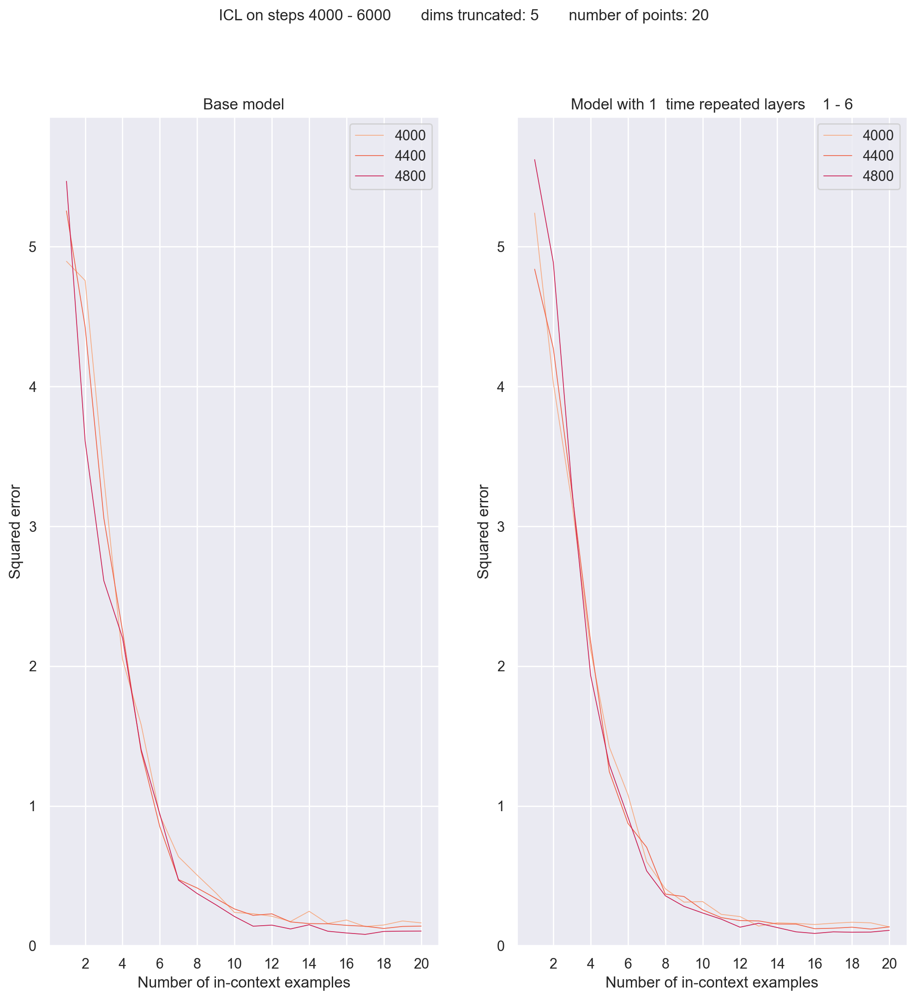

step 4200: train loss 1.0029, train loss 2 1.0029
step 4400: train loss 1.0151, train loss 2 1.0151
step 4600: train loss 1.0026, train loss 2 1.0026
step 4800: train loss 0.9499, train loss 2 0.9499
step 4999: train loss 0.9641, train loss 2 0.9641


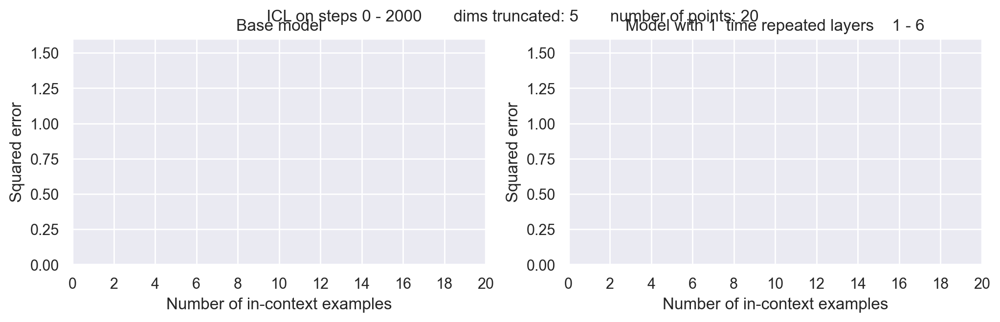

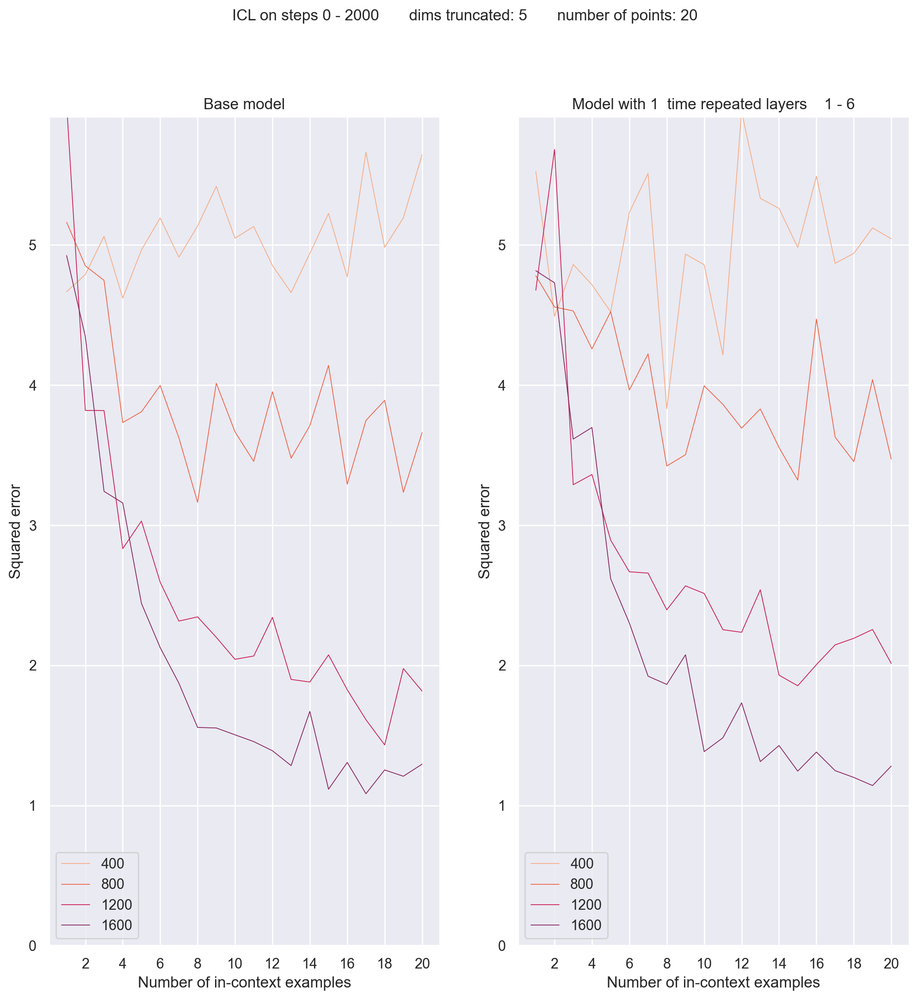

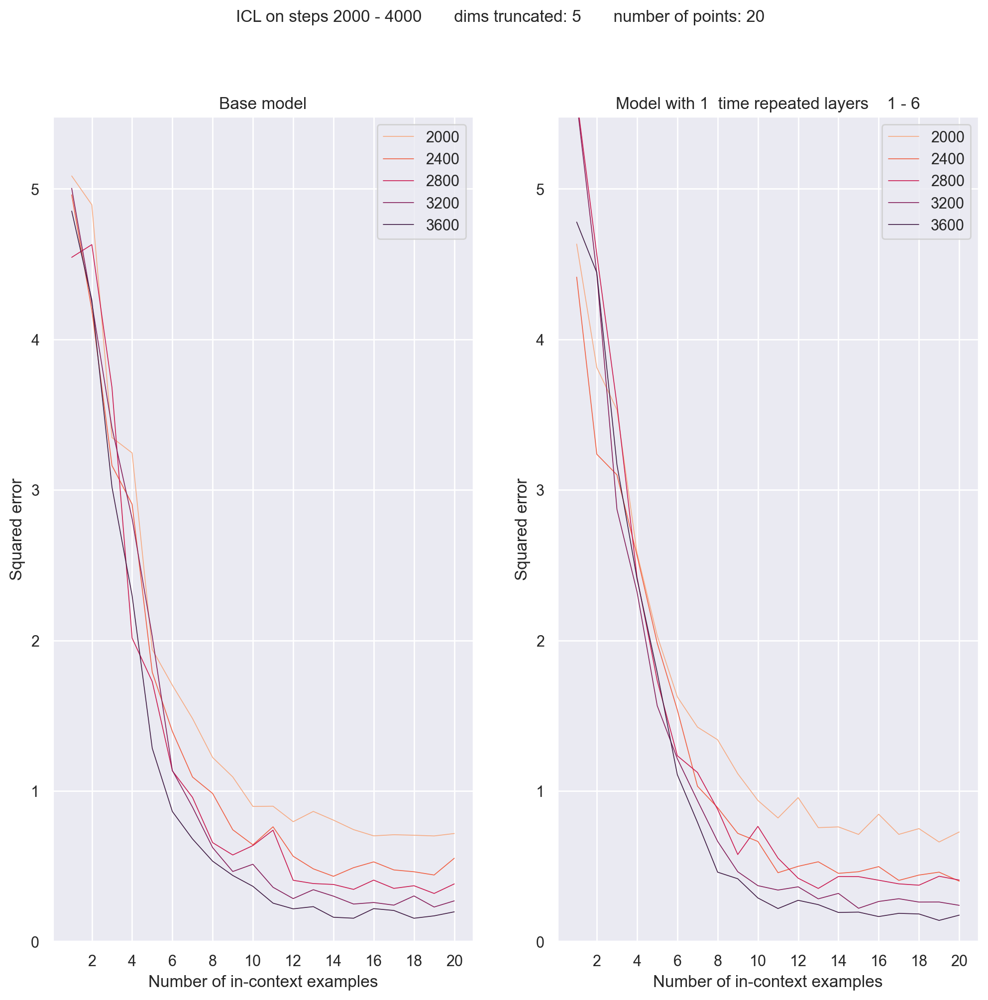

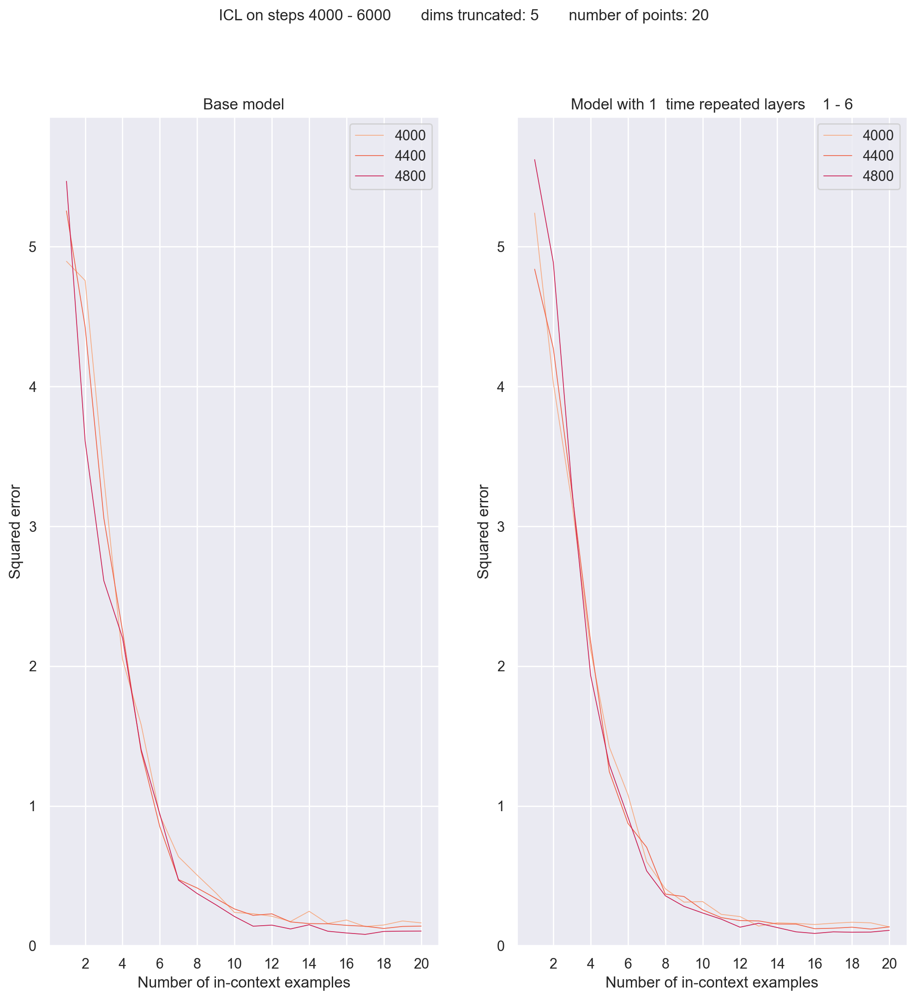

In [2]:
import yaml
short_name = 'permute_baseline'
update = 'permute_model: True'
update = yaml.safe_load(update)

clean_dirs_by_name(conf.out_dir, short_name)   
exp2 = Experiment(conf, short_name = short_name)
exp2.customize_experiment(update=update)
exp2.run_experiment()

Удваиваем все слои и это внезапно не оказывается хорошо, хотя по логике авторов 2 статьи слои должны выполнять одну и ту же задачу.
Важно, что основная модель в процессе перемешивается и это значит, что любой слой участвует в итерации метода Ньютона

Deleted directory: .\exp_models\linear_regression\checkpoints\permute_duplicate_baseline
Deleted directory: .\exp_models\linear_regression\plots\permute_duplicate_baseline
Running experiment with params:
    log_model_weights: True
    transform_conf:
        switch_params: None
        duplicate_params: [1, 3, 1]
        full_backbone_copy: True
        no_layernorm_full_backbone_copy: True
        first_n_layers: None
        new_backbone_training: False
        diverge_new_backbone_training: False
        readout2_training: True
        clear_readout2: False
        model_variants: ['modified', 'full_backbone + no_final_layer_norm']
        transform_choice: 1
        transform_variants: ['duplicate_layers', 'switch_layers', 'slice_layers']
        transform_func: <function variant.<locals>.decorator.<locals>.wrapper at 0x000002246E9DD0D0>
    auto_transform_conf:
        permute_bounds_params: [1, 3]
        permute_interval: 10
        permute_model: True
        auto_transform_ch

loss1,0.94127
loss2,1.04982


''

step 0: train loss 4.9616, train loss 2 4.9554


wandb: WARNING Step must only increase in log calls.  Step 0 < 9801; dropping {'loss1': tensor(4.9616), 'loss2': tensor(4.9554)}.


step 200: train loss 4.8978, train loss 2 4.9363


wandb: WARNING Step must only increase in log calls.  Step 200 < 9801; dropping {'loss1': tensor(4.8978), 'loss2': tensor(4.9363)}.


step 400: train loss 3.9532, train loss 2 4.8178


wandb: WARNING Step must only increase in log calls.  Step 400 < 9801; dropping {'loss1': tensor(3.9532), 'loss2': tensor(4.8178)}.


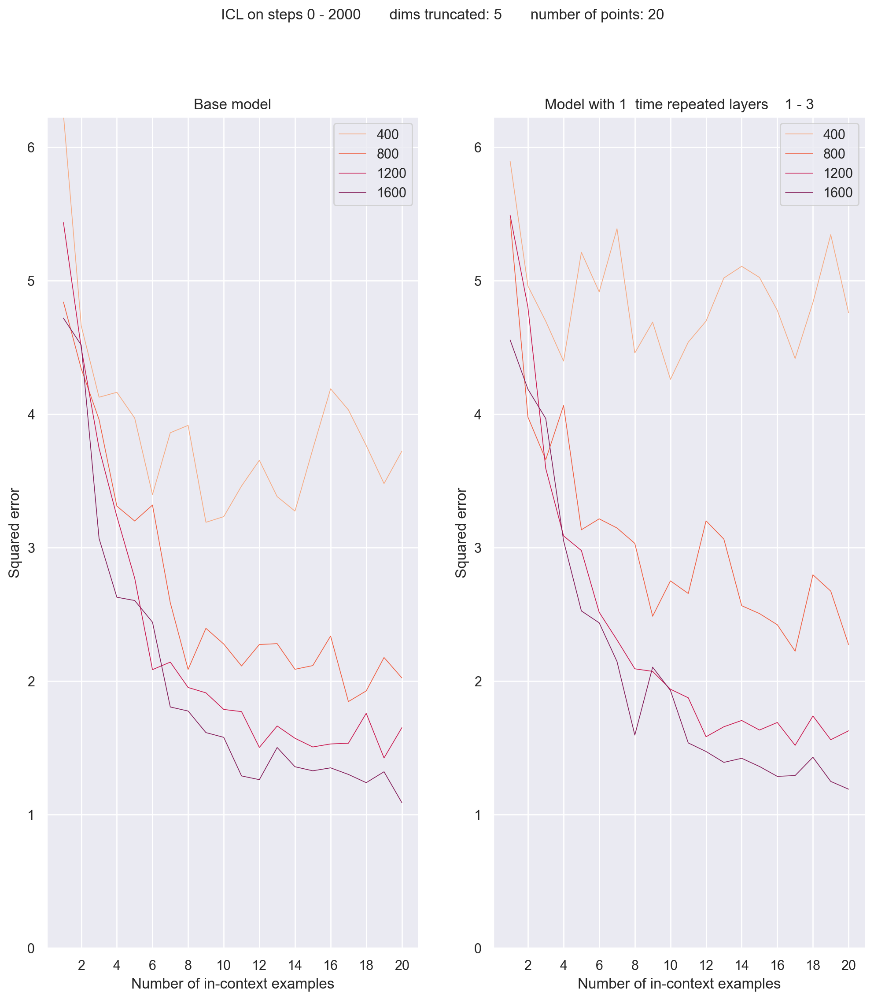

wandb: WARNING Step must only increase in log calls.  Step 400 < 9801; dropping {'my_lineplot_id': <wandb.viz.CustomChart object at 0x00000224775E0F10>, 'my_lineplot_id2': <wandb.viz.CustomChart object at 0x00000224B2317640>}.


step 600: train loss 2.9986, train loss 2 3.4482


wandb: WARNING Step must only increase in log calls.  Step 600 < 9801; dropping {'loss1': tensor(2.9986), 'loss2': tensor(3.4482)}.


step 800: train loss 2.6951, train loss 2 3.0280


wandb: WARNING Step must only increase in log calls.  Step 800 < 9801; dropping {'loss1': tensor(2.6951), 'loss2': tensor(3.0280)}.
wandb: WARNING Step must only increase in log calls.  Step 800 < 9801; dropping {'my_lineplot_id': <wandb.viz.CustomChart object at 0x00000224D37855E0>, 'my_lineplot_id2': <wandb.viz.CustomChart object at 0x00000224BD288CD0>}.


step 1000: train loss 2.5057, train loss 2 2.6164


wandb: WARNING Step must only increase in log calls.  Step 1000 < 9801; dropping {'loss1': tensor(2.5057), 'loss2': tensor(2.6164)}.


step 1200: train loss 2.1763, train loss 2 2.2778


wandb: WARNING Step must only increase in log calls.  Step 1200 < 9801; dropping {'loss1': tensor(2.1763), 'loss2': tensor(2.2778)}.
wandb: WARNING Step must only increase in log calls.  Step 1200 < 9801; dropping {'my_lineplot_id': <wandb.viz.CustomChart object at 0x00000224B23465B0>, 'my_lineplot_id2': <wandb.viz.CustomChart object at 0x0000022479104A00>}.


step 1400: train loss 2.1322, train loss 2 2.1889


wandb: WARNING Step must only increase in log calls.  Step 1400 < 9801; dropping {'loss1': tensor(2.1322), 'loss2': tensor(2.1889)}.


step 1600: train loss 2.0107, train loss 2 2.1207


wandb: WARNING Step must only increase in log calls.  Step 1600 < 9801; dropping {'loss1': tensor(2.0107), 'loss2': tensor(2.1207)}.
wandb: WARNING Step must only increase in log calls.  Step 1600 < 9801; dropping {'my_lineplot_id': <wandb.viz.CustomChart object at 0x0000022479104370>, 'my_lineplot_id2': <wandb.viz.CustomChart object at 0x000002247A397280>}.


step 1800: train loss 1.9349, train loss 2 2.0396


wandb: WARNING Step must only increase in log calls.  Step 1800 < 9801; dropping {'loss1': tensor(1.9349), 'loss2': tensor(2.0396)}.


step 2000: train loss 1.8400, train loss 2 1.9626


wandb: WARNING Step must only increase in log calls.  Step 2000 < 9801; dropping {'loss1': tensor(1.8400), 'loss2': tensor(1.9626)}.


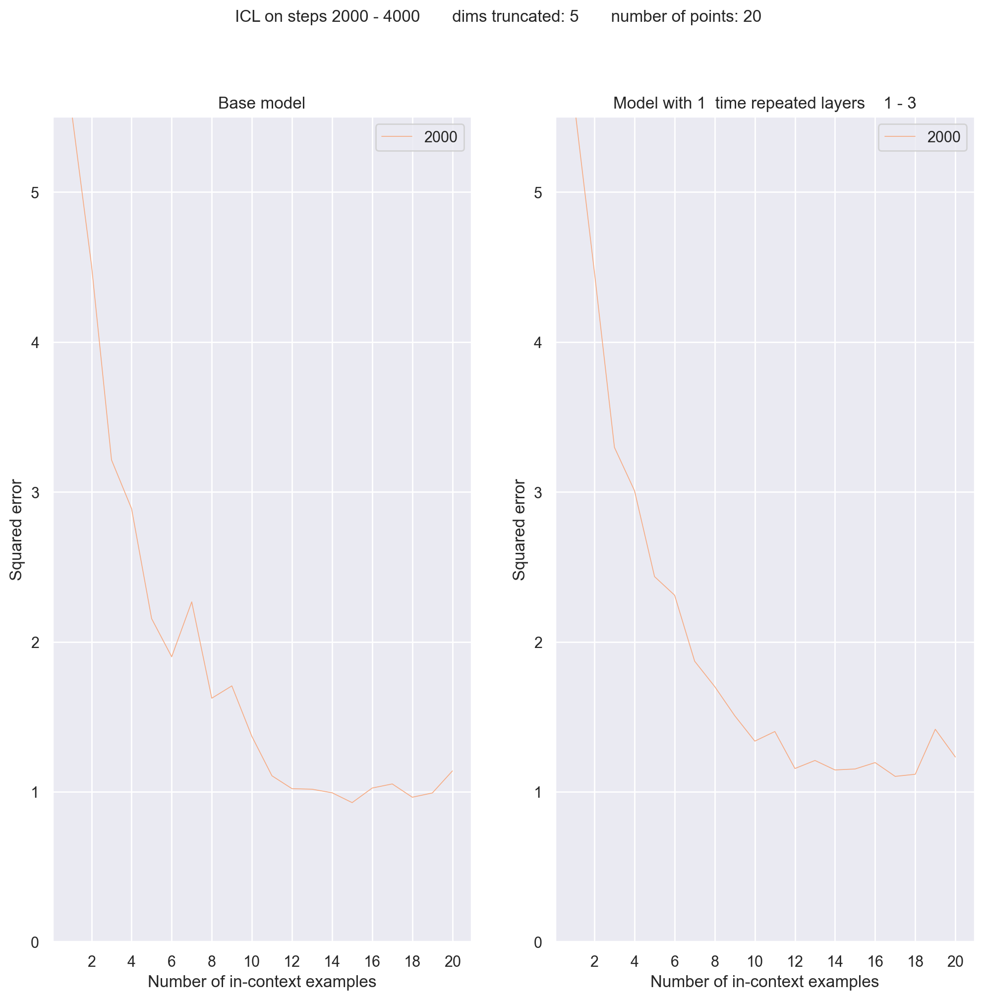

wandb: WARNING Step must only increase in log calls.  Step 2000 < 9801; dropping {'my_lineplot_id': <wandb.viz.CustomChart object at 0x00000224774A6F10>, 'my_lineplot_id2': <wandb.viz.CustomChart object at 0x00000225067A07F0>}.


step 2200: train loss 1.7936, train loss 2 1.9162


wandb: WARNING Step must only increase in log calls.  Step 2200 < 9801; dropping {'loss1': tensor(1.7936), 'loss2': tensor(1.9162)}.


KeyboardInterrupt: 

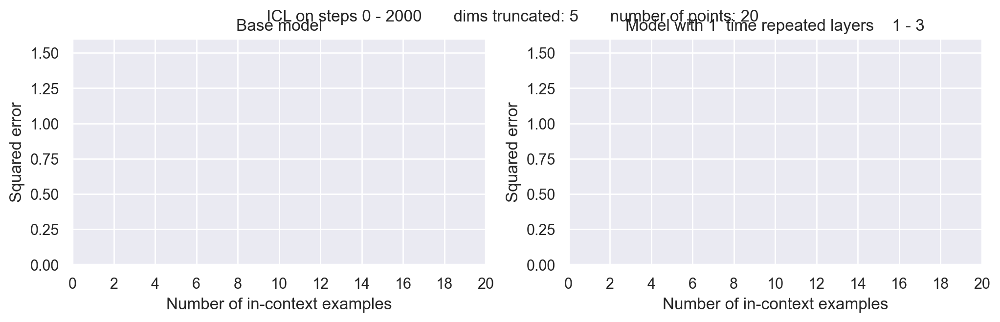

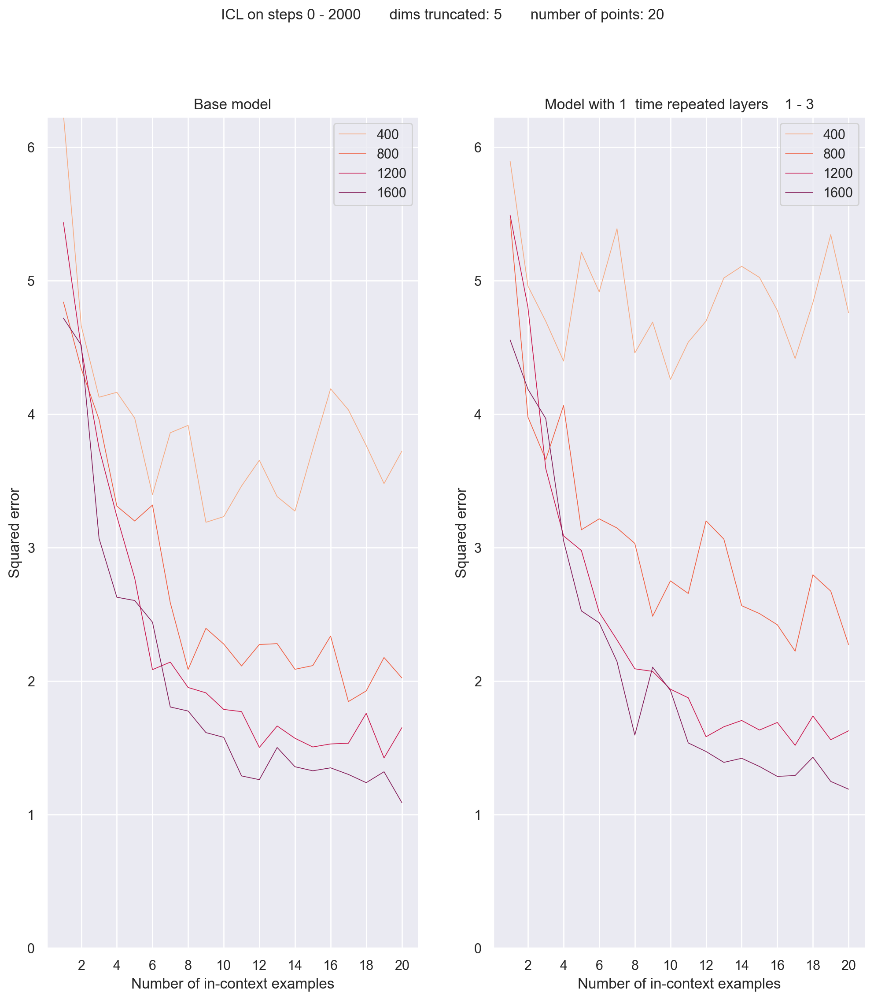

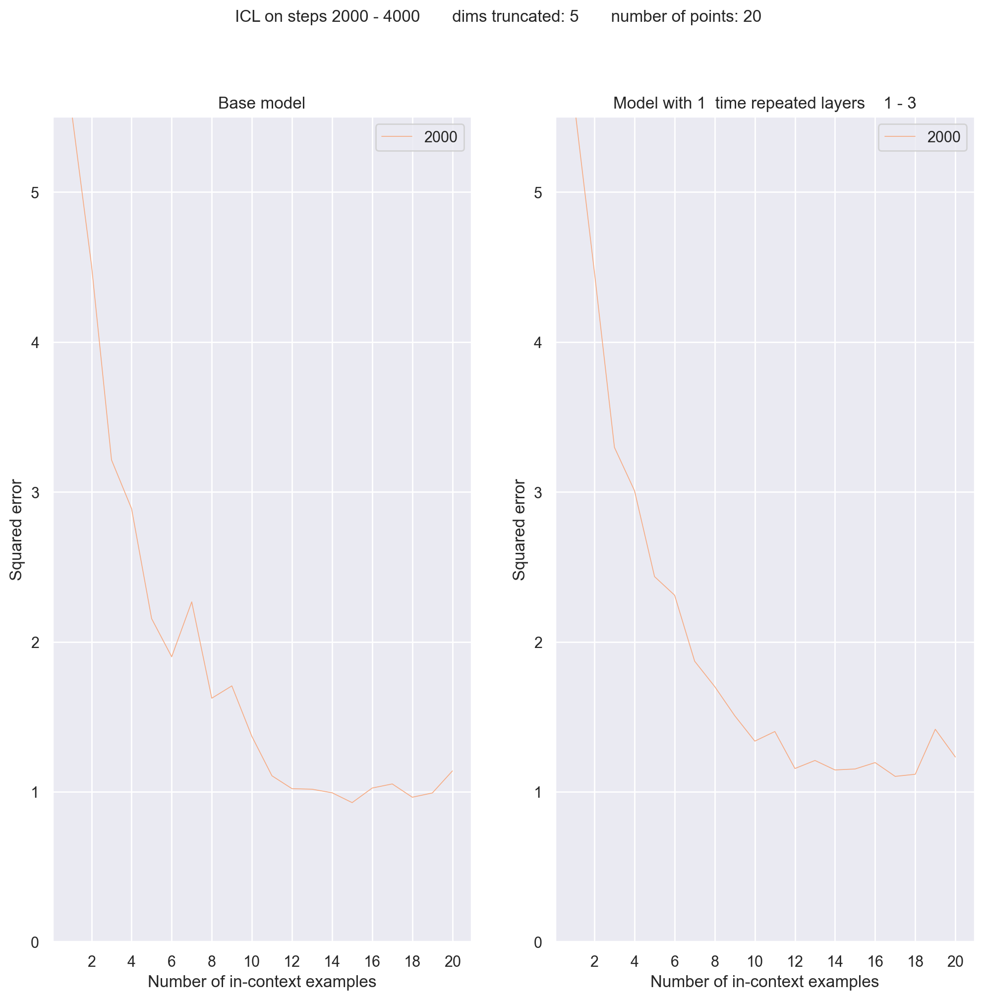

In [3]:
import yaml
short_name = 'permute_duplicate_baseline'
update = """
duplicate_params: [1, 3, 1]
new_backbone_training: False
full_backbone_copy: True
no_layernorm_full_backbone_copy: True
readout2_training: True
permute_model: True
"""
update = yaml.safe_load(update)

clean_dirs_by_name(conf.out_dir, short_name)   
exp3 = Experiment(conf, short_name = short_name)
exp3.customize_experiment(update=update)
exp3.run_experiment()

Deleted directory: .\exp_models\linear_regression\checkpoints\permute_rnn_duplicate_baseline
Deleted directory: .\exp_models\linear_regression\plots\permute_rnn_duplicate_baseline
Running experiment with params:
    log_model_weights: True
    transform_conf:
        switch_params: None
        duplicate_params: [1, 3, 1]
        slice_params: [1, 3]
        full_backbone_copy: True
        no_layernorm_full_backbone_copy: False
        first_n_layers: None
        new_backbone_training: True
        diverge_new_backbone_training: True
        readout2_training: True
        clear_readout2: False
        model_variants: ['modified', 'full_backbone + no_final_layer_norm']
        transform_choice: 3
        transform_variants: ['duplicate_layers', 'switch_layers', 'slice_layers']
        transform_func: <function variant.<locals>.decorator.<locals>.wrapper at 0x000001BBF5642AF0>
    auto_transform_conf:
        permute_bounds_params: [1, 3]
        permute_interval: 10
        permute_m

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: enemo_ce-warch (use `wandb login --relogin` to force relogin)


''

step 0: train loss 12.5693, train loss 2 9.8585


KeyboardInterrupt: 

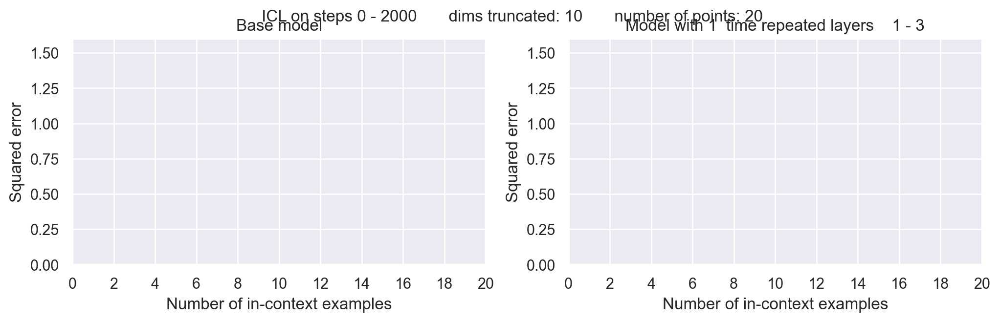

In [1]:
import torch
import matplotlib.pyplot as plt
%config InlineBackend.figure_format='retina'
from configurations import build_conf
from clean_logs_tool import clean_dirs_by_name


device = 'cuda' if torch.cuda.is_available() else 'cpu'


from quinine import Quinfig
from schema import schema
from experiments import Experiment


config_path = './configs/main.yaml'  # specify your config file path here

conf = Quinfig(config_path=config_path, schema=schema)
#conf = build_conf(conf)


#Experiment.yaml_experiment_info(conf)

"""
Выведем дефолтные конфигурации эксперимента
По умолчанию transform_func и auto_transform_func это первые элементы списков transform_variants и auto_transform_variants
transform преобразования делают измененную копию модели, для нее строится 2 график каждый eval цикл, обычно копия модели не учится
auto transform меняет основную модель - нас интересует перемешивание слоев, но можно делать и другие любые преобразования
"""




import yaml
short_name = 'permute_rnn_duplicate_baseline'
update = """
new_backbone_training: True
full_backbone_copy: True
diverge_new_backbone_training: True
transform_choice: 3
readout2_training: True
permute_model: True
"""
update = yaml.safe_load(update)

clean_dirs_by_name(conf.out_dir, short_name)   
exp3 = Experiment(conf, short_name = short_name)
exp3.customize_experiment(update=update)
wandb_run = exp3.run_experiment()
#history = wandb_run.scan_history(keys=["loss1"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               ])

# Extract the loss values from the history
losses = [row["Loss"] for row in history]

Deleted directory: .\exp_models\linear_regression\checkpoints\permute_rnn_duplicate_baseline
Deleted directory: .\exp_models\linear_regression\plots\permute_rnn_duplicate_baseline
Running experiment with params:
    log_model_weights: True
    transform_conf:
        switch_params: None
        duplicate_params: [1, 3, 1]
        slice_params: [1, 3]
        full_backbone_copy: True
        no_layernorm_full_backbone_copy: False
        first_n_layers: None
        new_backbone_training: False
        diverge_new_backbone_training: False
        readout2_training: True
        clear_readout2: False
        model_variants: ['modified', 'full_backbone + no_final_layer_norm']
        transform_choice: 1
        transform_variants: ['duplicate_layers', 'switch_layers', 'slice_layers']
        transform_func: <function variant.<locals>.decorator.<locals>.wrapper at 0x0000023E358429D0>
    auto_transform_conf:
        permute_bounds_params: [1, 3]
        permute_interval: 10
        permute

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: enemo_ce-warch (use `wandb login --relogin` to force relogin)


''

step 0: train loss 4.9061, train loss 2 4.8130
step 200: train loss 4.9383, train loss 2 4.9413
step 400: train loss 5.0349, train loss 2 5.0433


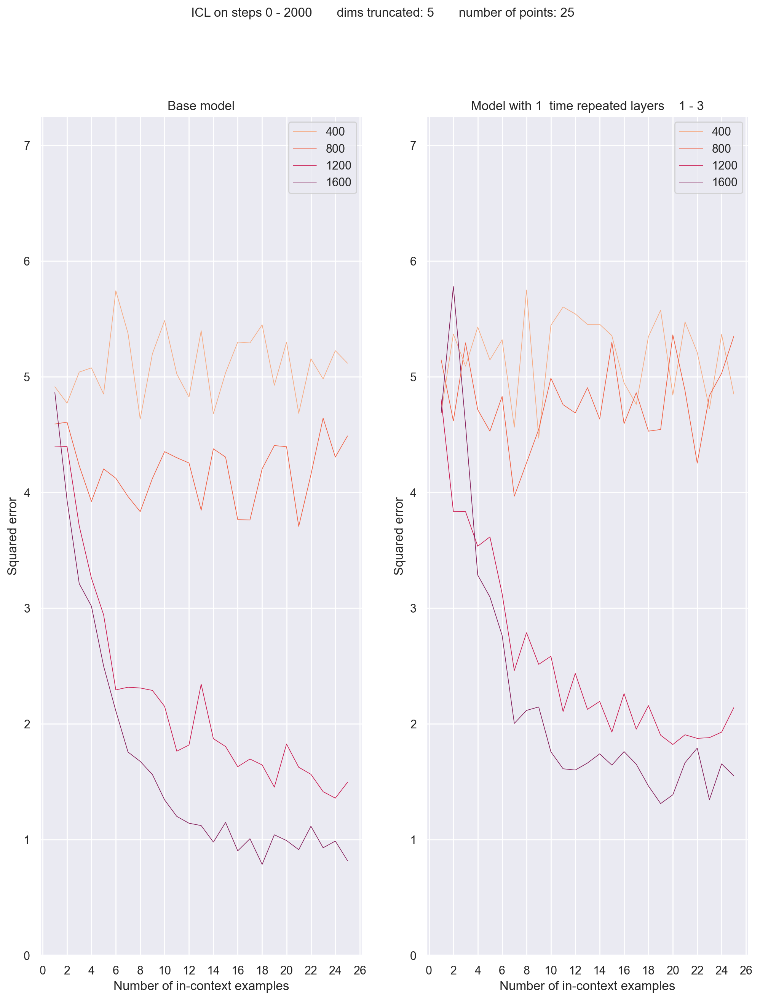

step 600: train loss 5.0516, train loss 2 5.0960
step 800: train loss 4.4349, train loss 2 4.7437
step 1000: train loss 2.9232, train loss 2 3.5866
step 1200: train loss 2.3017, train loss 2 2.7269
step 1400: train loss 1.9909, train loss 2 2.4048
step 1600: train loss 1.7381, train loss 2 2.2286
step 1800: train loss 1.6267, train loss 2 2.1028
step 2000: train loss 1.3974, train loss 2 1.8248


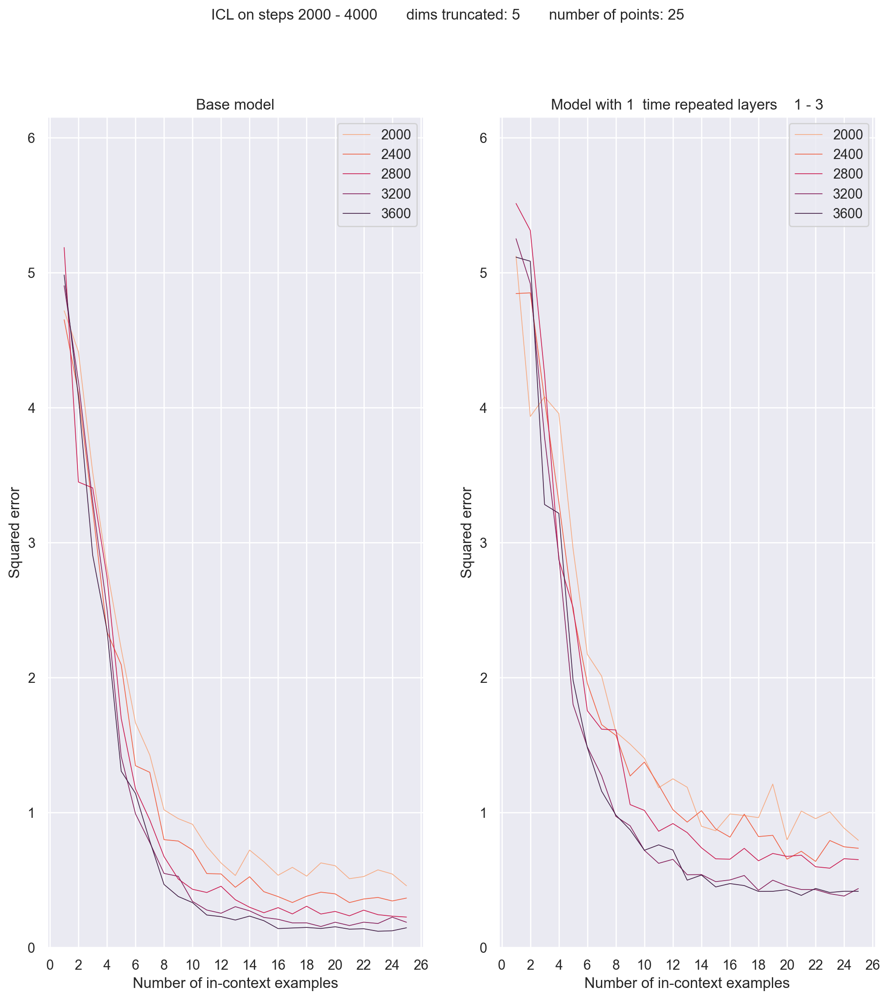

step 2200: train loss 1.1841, train loss 2 1.6507
step 2400: train loss 1.1166, train loss 2 1.6065
step 2600: train loss 1.0684, train loss 2 1.5786
step 2800: train loss 0.9813, train loss 2 1.4238
step 3000: train loss 0.9675, train loss 2 1.3283
step 3200: train loss 0.9684, train loss 2 1.3202
step 3400: train loss 0.8763, train loss 2 1.2031
step 3600: train loss 0.8783, train loss 2 1.3411
step 3800: train loss 0.8300, train loss 2 1.1358
step 4000: train loss 0.8648, train loss 2 1.2531


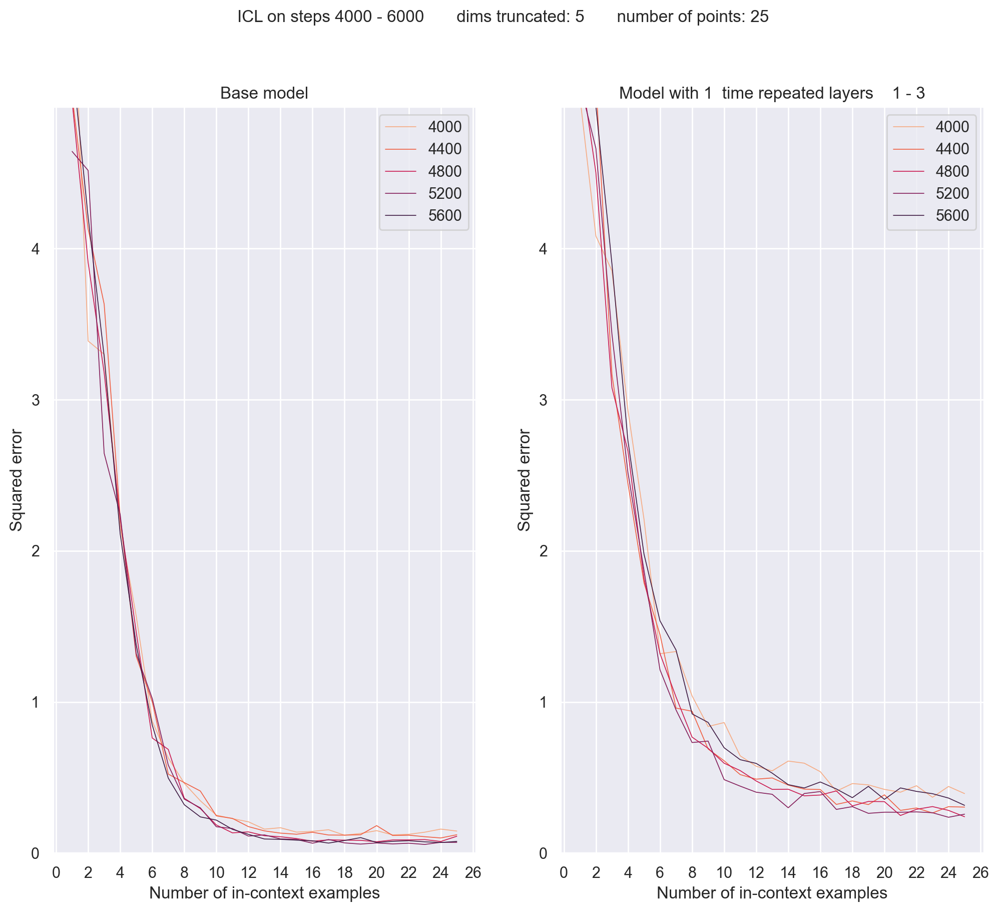

step 4200: train loss 0.8375, train loss 2 1.1756
step 4400: train loss 0.7953, train loss 2 1.1522
step 4600: train loss 0.8113, train loss 2 1.1188
step 4800: train loss 0.7964, train loss 2 1.1087
step 5000: train loss 0.7725, train loss 2 1.0849
step 5200: train loss 0.7572, train loss 2 1.0321
step 5400: train loss 0.7570, train loss 2 1.0862
step 5600: train loss 0.7646, train loss 2 1.1188
step 5800: train loss 0.7437, train loss 2 1.0403
step 6000: train loss 0.7404, train loss 2 1.0021


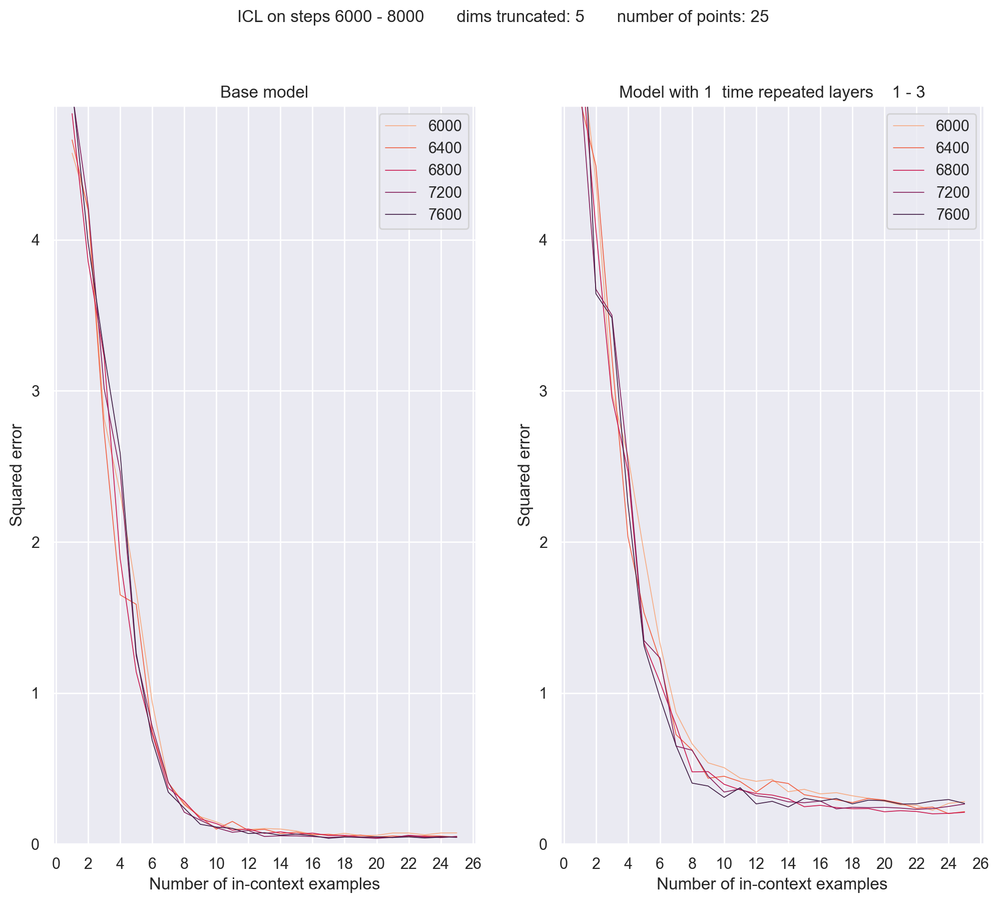

step 6200: train loss 0.7622, train loss 2 1.0425
step 6400: train loss 0.7176, train loss 2 0.9569
step 6600: train loss 0.7248, train loss 2 0.9649
step 6800: train loss 0.7193, train loss 2 0.9337
step 7000: train loss 0.7551, train loss 2 1.0124
step 7200: train loss 0.7448, train loss 2 0.9905
step 7400: train loss 0.7170, train loss 2 0.8964
step 7600: train loss 0.7127, train loss 2 0.9196
step 7800: train loss 0.7162, train loss 2 0.9108
step 8000: train loss 0.7253, train loss 2 0.8969


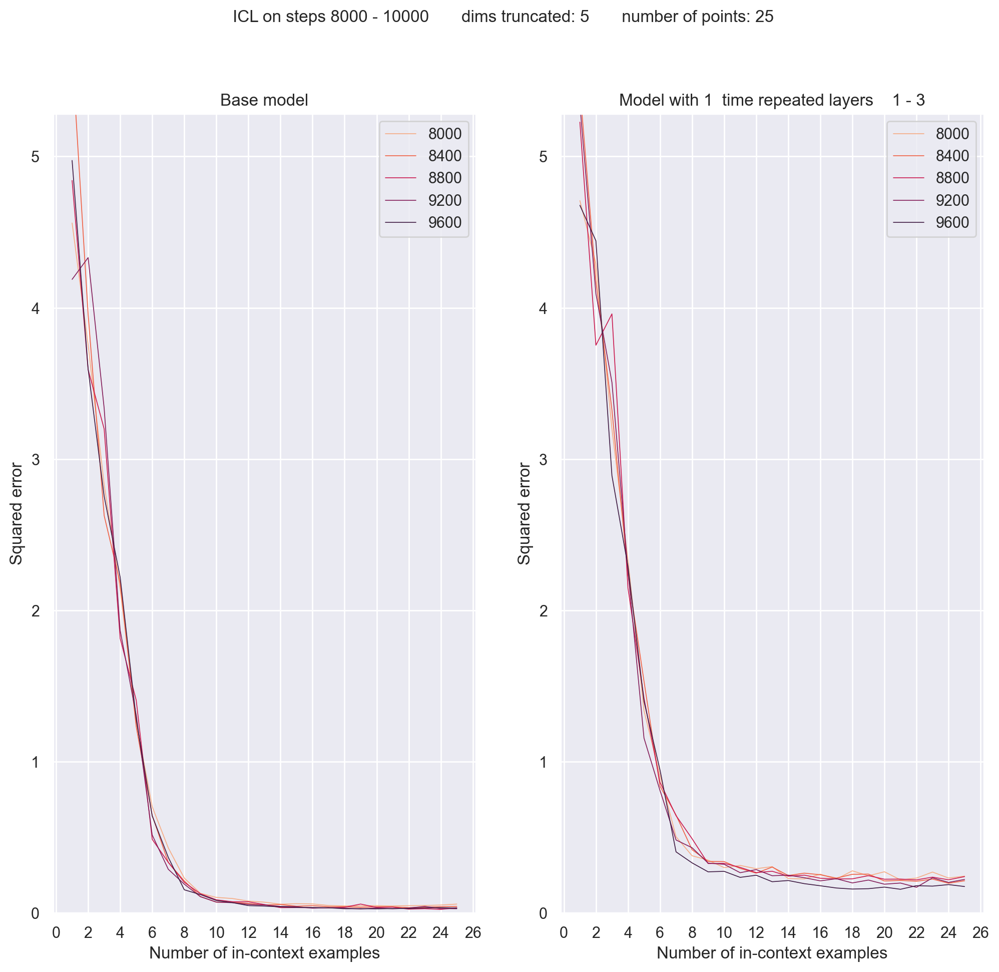

step 8200: train loss 0.7038, train loss 2 0.9175
step 8400: train loss 0.7115, train loss 2 0.9057
step 8600: train loss 0.6831, train loss 2 0.8738
step 8800: train loss 0.6803, train loss 2 0.8607
step 9000: train loss 0.7160, train loss 2 0.8775
step 9200: train loss 0.6878, train loss 2 0.8641
step 9400: train loss 0.6764, train loss 2 0.8582
step 9600: train loss 0.6986, train loss 2 0.8716
step 9800: train loss 0.6704, train loss 2 0.8350
step 10000: train loss 0.6985, train loss 2 0.8760


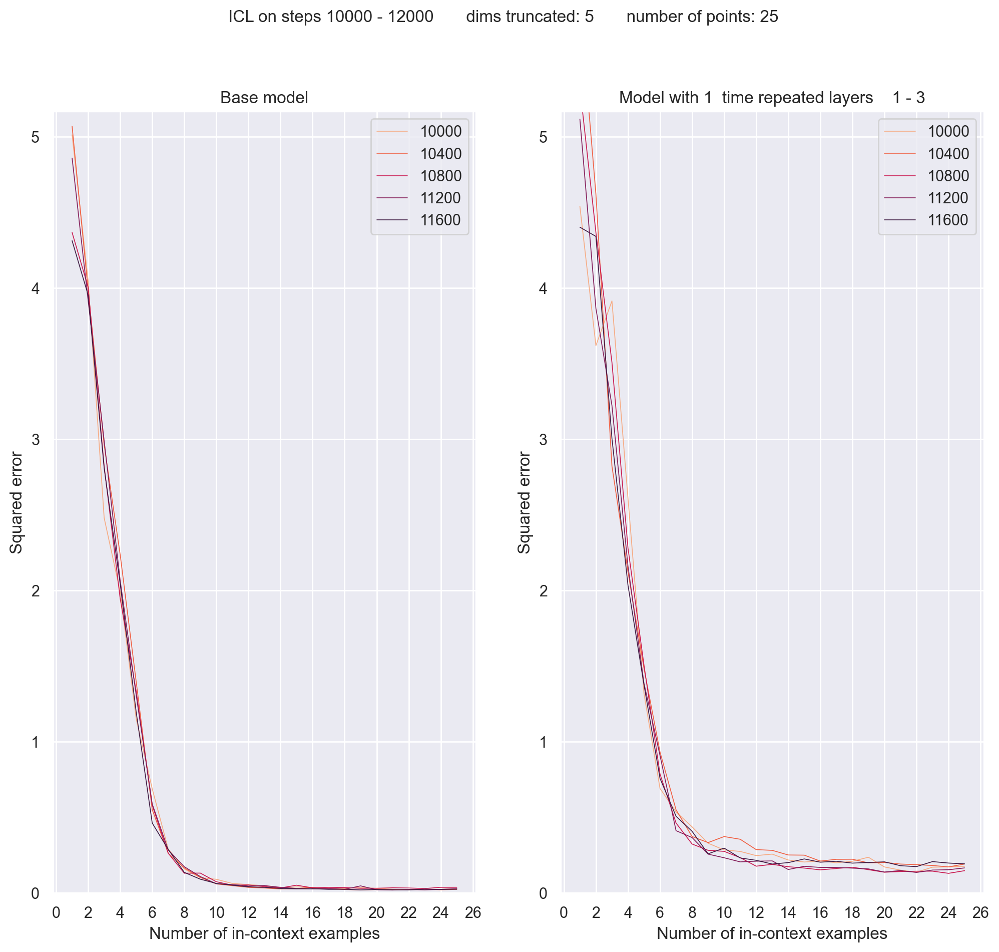

step 10200: train loss 0.6851, train loss 2 0.8710
step 10400: train loss 0.6477, train loss 2 0.8365
step 10600: train loss 0.7083, train loss 2 0.8471
step 10800: train loss 0.6631, train loss 2 0.7859
step 11000: train loss 0.6503, train loss 2 0.7927
step 11200: train loss 0.6892, train loss 2 0.8583
step 11400: train loss 0.6910, train loss 2 0.8588
step 11600: train loss 0.6990, train loss 2 0.8718
step 11800: train loss 0.6597, train loss 2 0.8070
step 12000: train loss 0.6491, train loss 2 0.7899


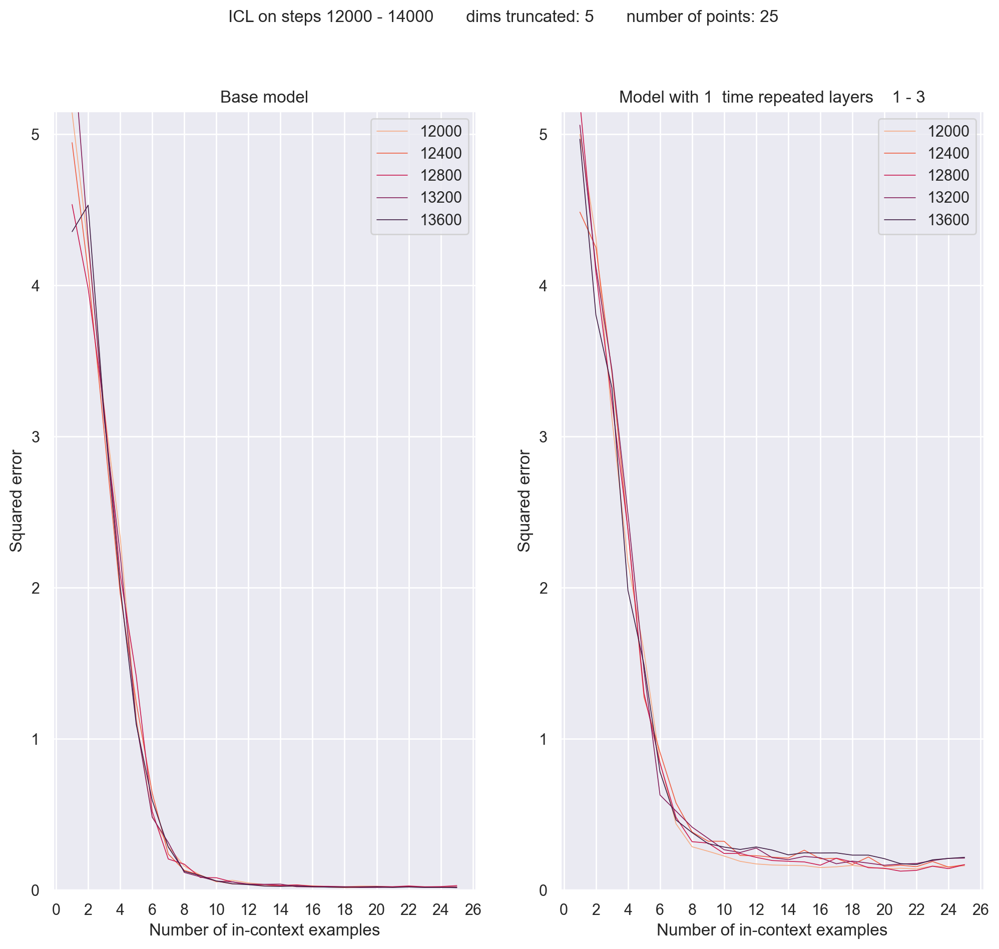

step 12200: train loss 0.7026, train loss 2 0.8607
step 12400: train loss 0.6837, train loss 2 0.8562
step 12600: train loss 0.6815, train loss 2 0.8210
step 12800: train loss 0.6705, train loss 2 0.8512
step 13000: train loss 0.6708, train loss 2 0.8307
step 13200: train loss 0.6668, train loss 2 0.8370
step 13400: train loss 0.6781, train loss 2 0.8795
step 13600: train loss 0.6475, train loss 2 0.8555
step 13800: train loss 0.6929, train loss 2 0.9011
step 14000: train loss 0.6885, train loss 2 0.8680


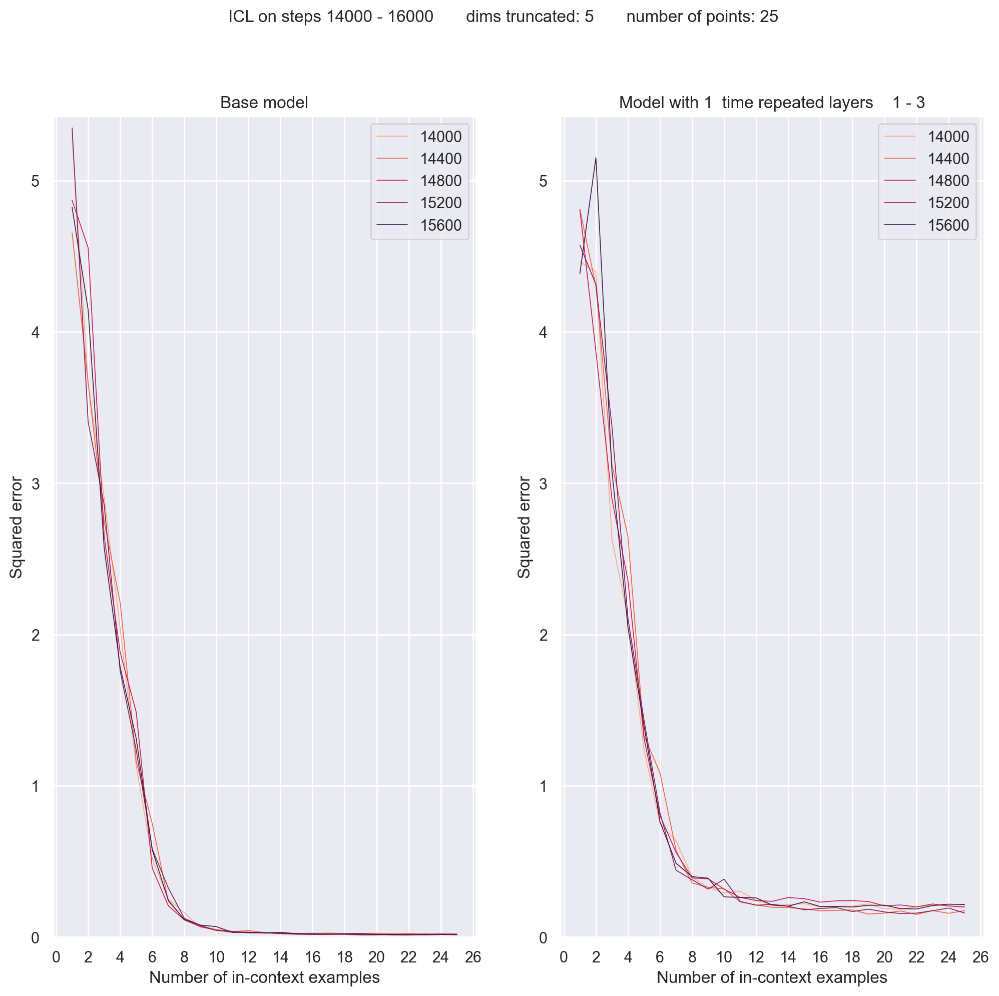

step 14200: train loss 0.6650, train loss 2 0.8247
step 14400: train loss 0.6735, train loss 2 0.8596
step 14600: train loss 0.6598, train loss 2 0.8105
step 14800: train loss 0.6856, train loss 2 0.8929
step 15000: train loss 0.6988, train loss 2 0.8653
step 15200: train loss 0.6625, train loss 2 0.8271
step 15400: train loss 0.6520, train loss 2 0.8037
step 15600: train loss 0.6505, train loss 2 0.8619
step 15800: train loss 0.7039, train loss 2 0.9152
step 16000: train loss 0.6889, train loss 2 0.8649


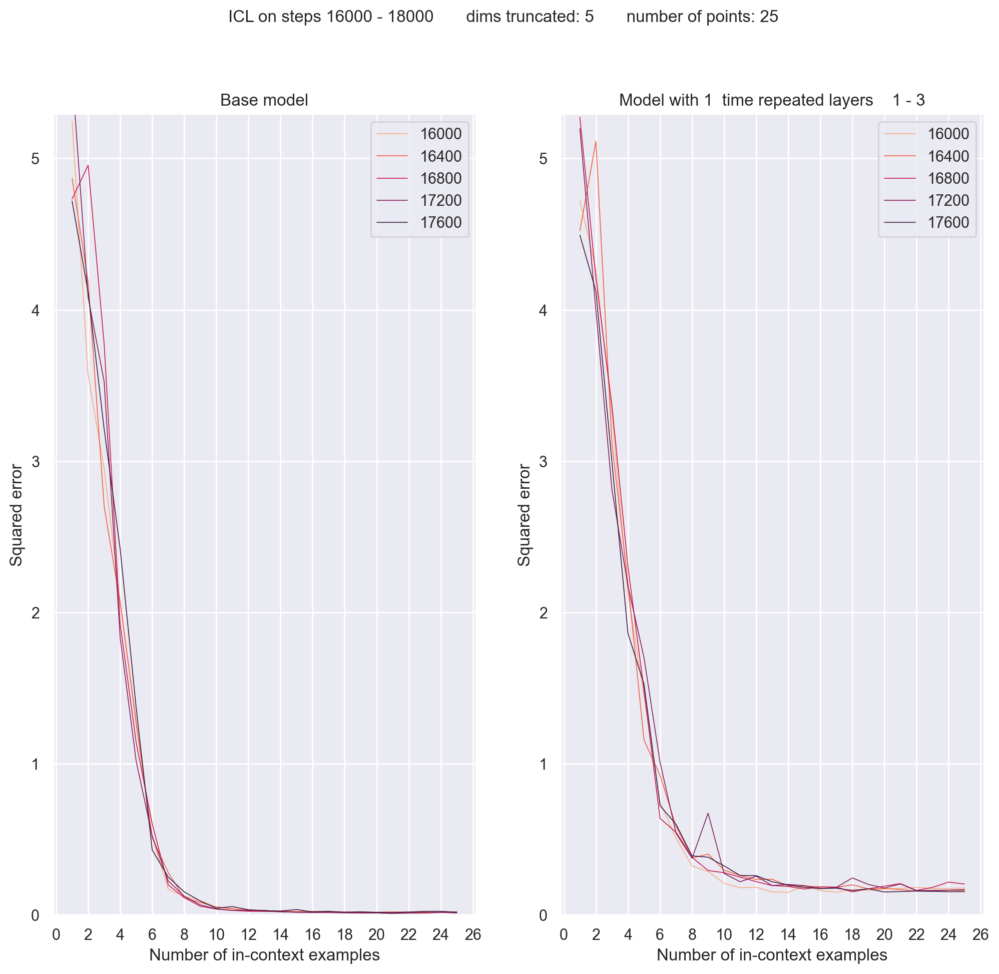

step 16200: train loss 0.6732, train loss 2 0.8611
step 16400: train loss 0.6590, train loss 2 0.8449
step 16600: train loss 0.6513, train loss 2 0.8309
step 16800: train loss 0.6698, train loss 2 0.8520
step 17000: train loss 0.6604, train loss 2 0.8631
step 17200: train loss 0.6451, train loss 2 0.8203
step 17400: train loss 0.6531, train loss 2 0.8049
step 17600: train loss 0.6439, train loss 2 0.8366
step 17800: train loss 0.6450, train loss 2 0.7987
step 18000: train loss 0.6340, train loss 2 0.8085


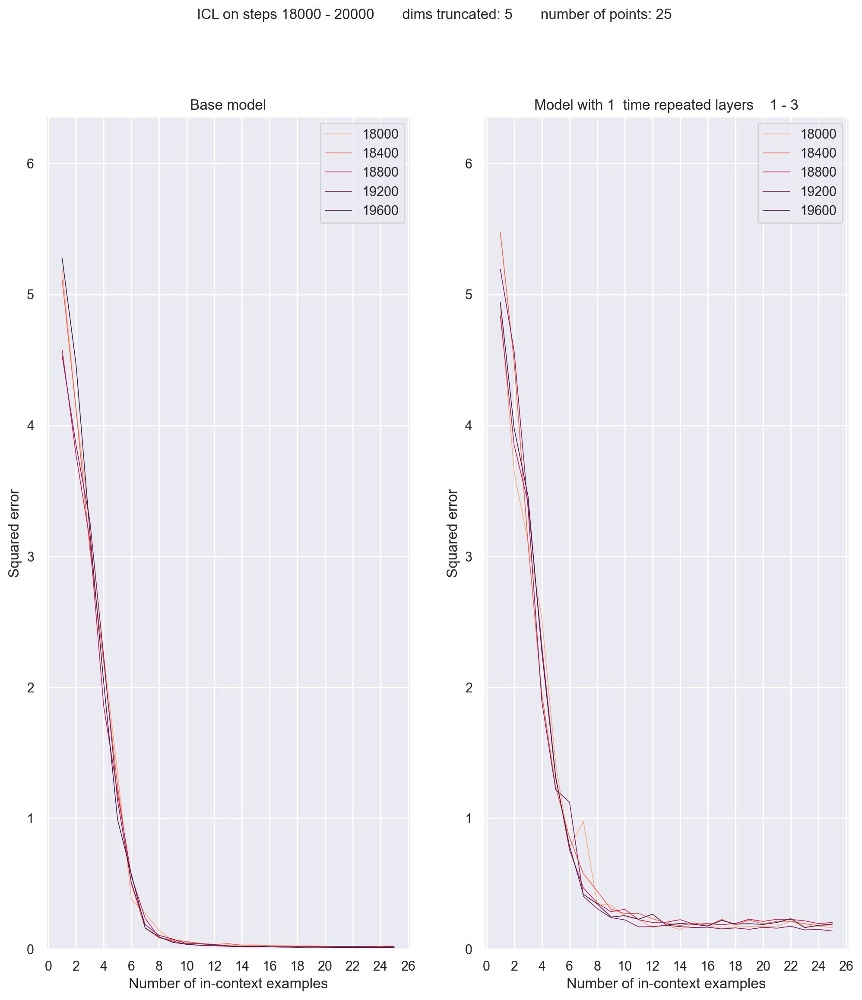

step 18200: train loss 0.6908, train loss 2 0.8596
step 18400: train loss 0.6798, train loss 2 0.8603
step 18600: train loss 0.6826, train loss 2 0.9219
step 18800: train loss 0.6632, train loss 2 0.8770
step 19000: train loss 0.6690, train loss 2 0.8750
step 19200: train loss 0.6534, train loss 2 0.8153
step 19400: train loss 0.6509, train loss 2 0.8459
step 19600: train loss 0.6357, train loss 2 0.8191
step 19800: train loss 0.6584, train loss 2 0.8604
step 19999: train loss 0.6683, train loss 2 0.8749


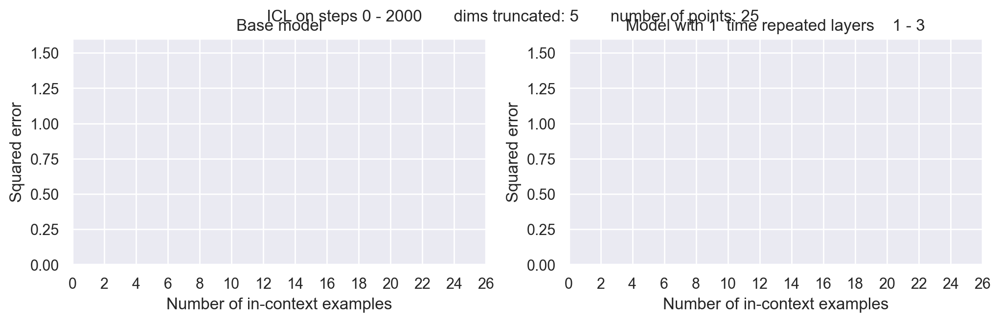

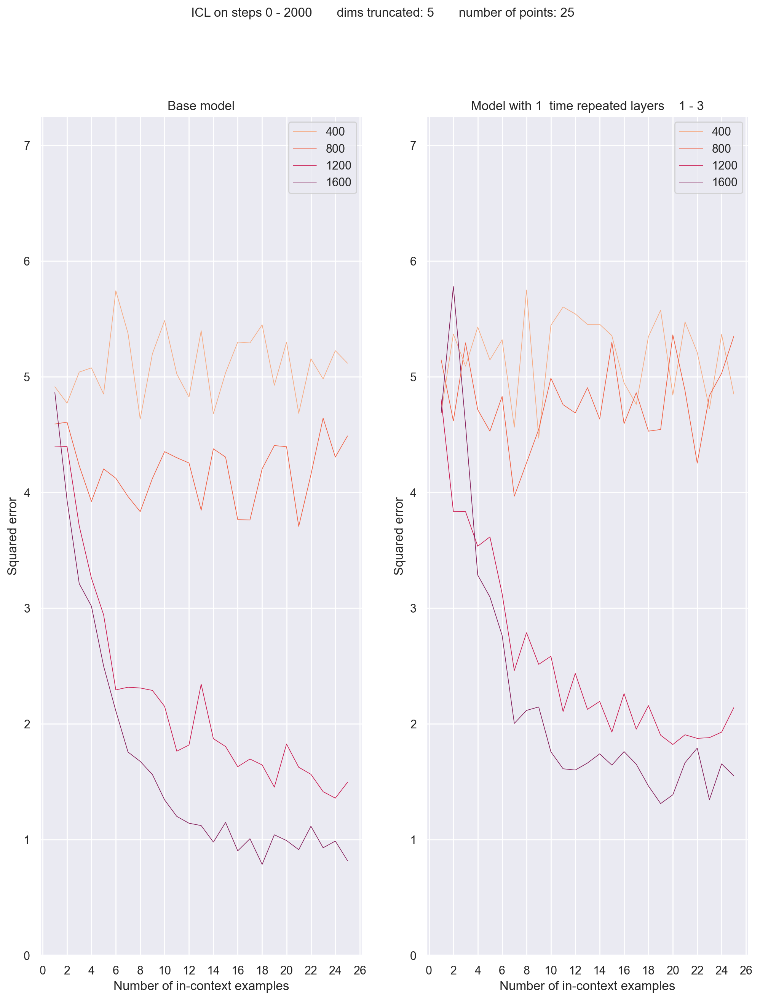

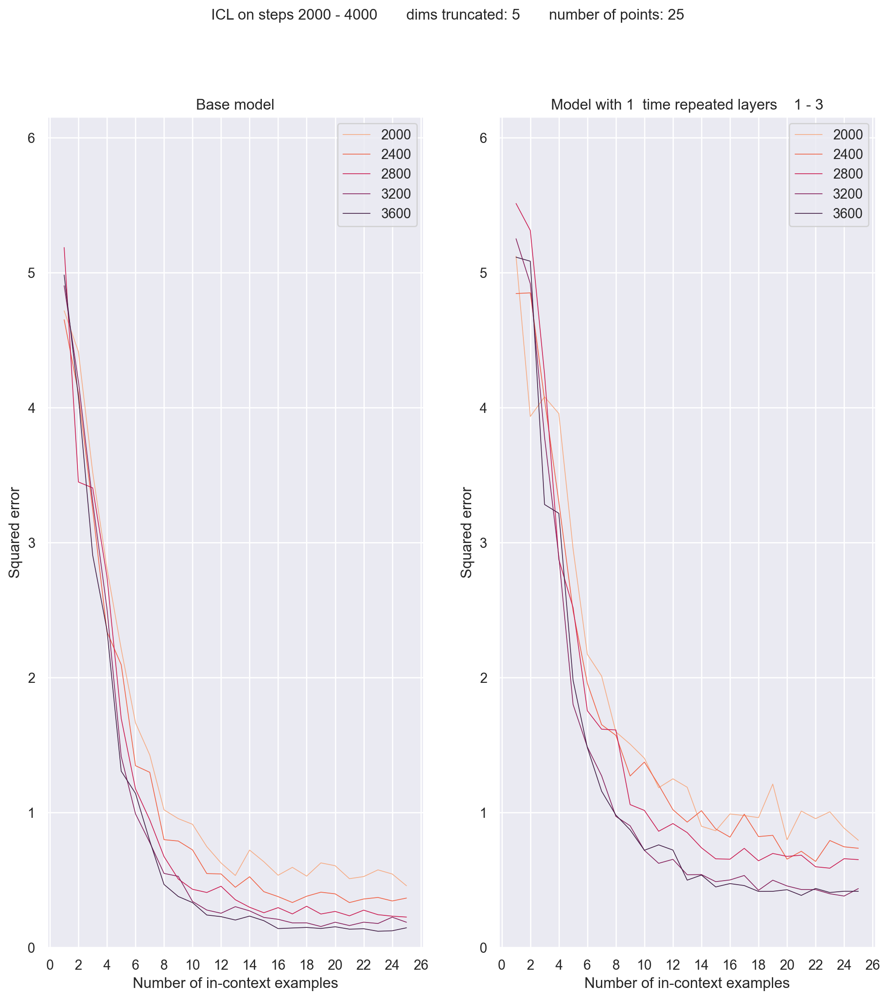

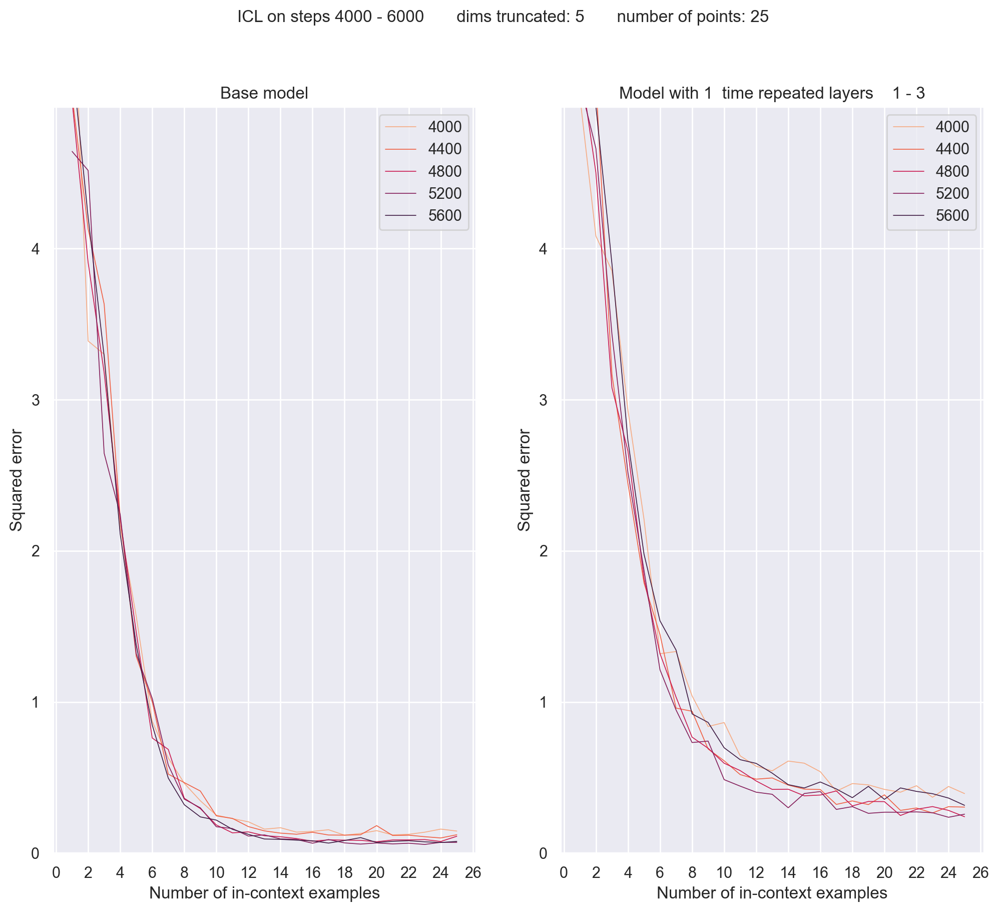

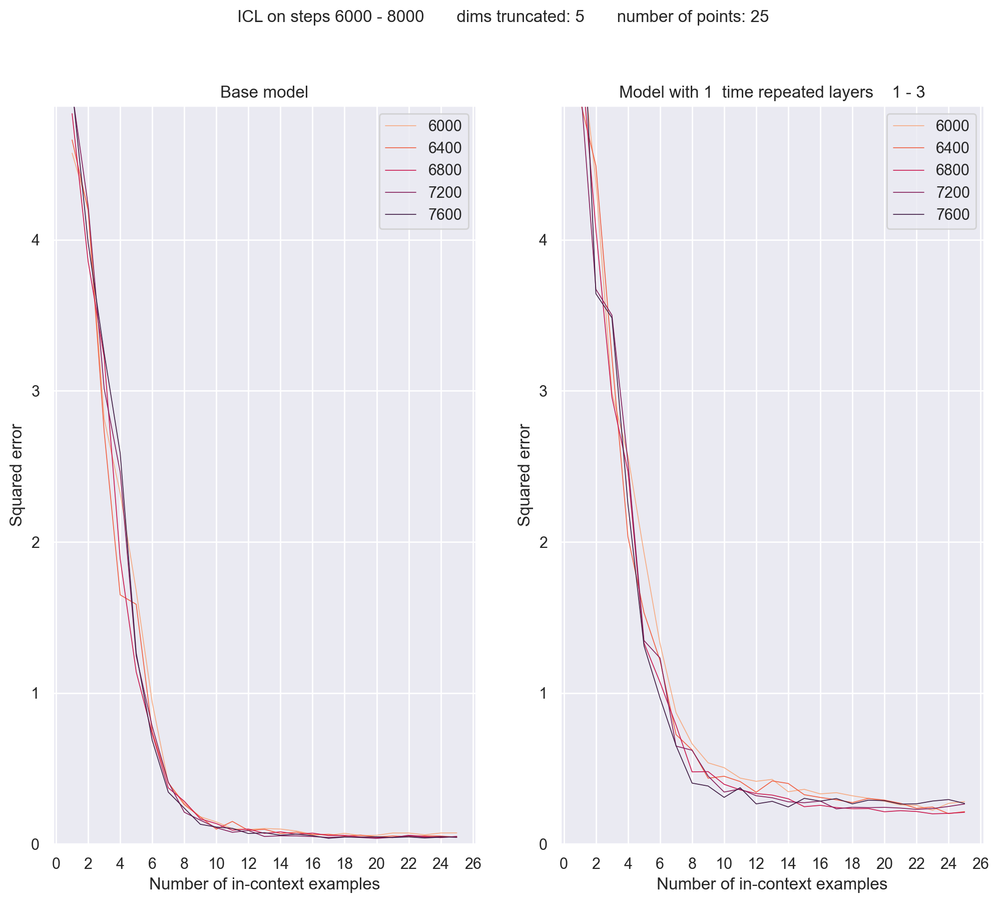

...

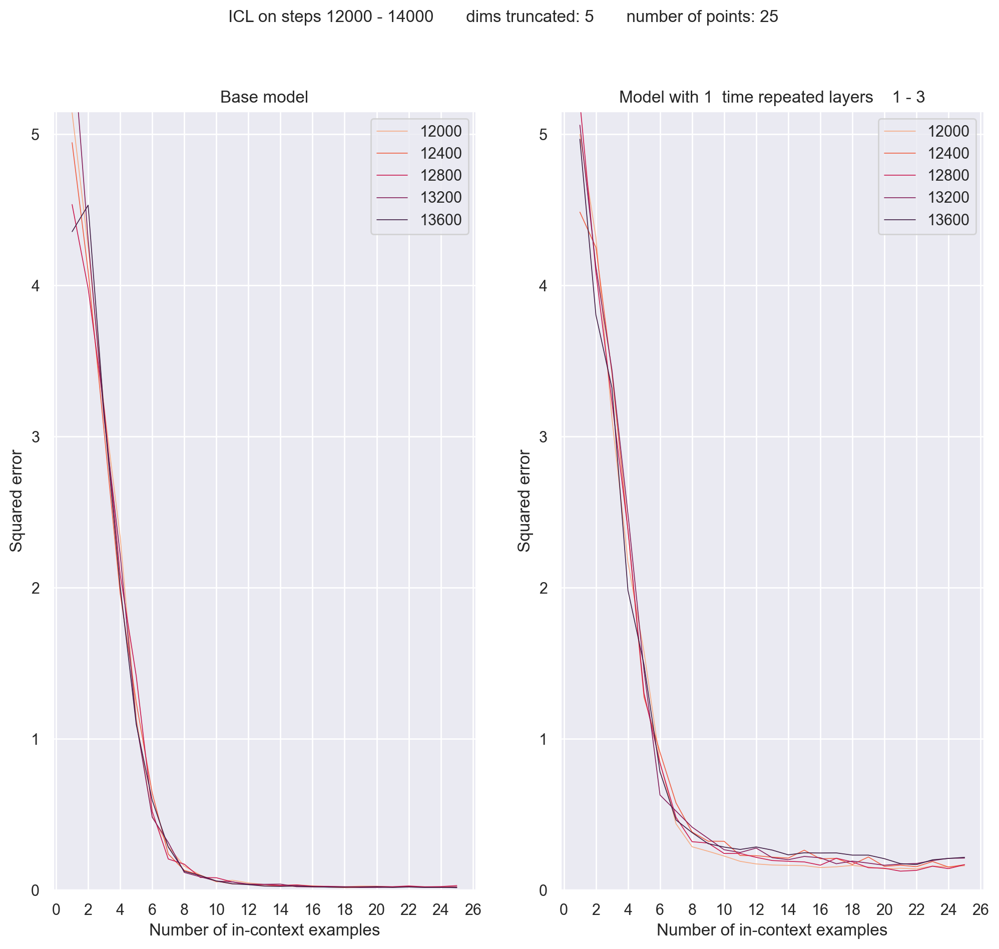

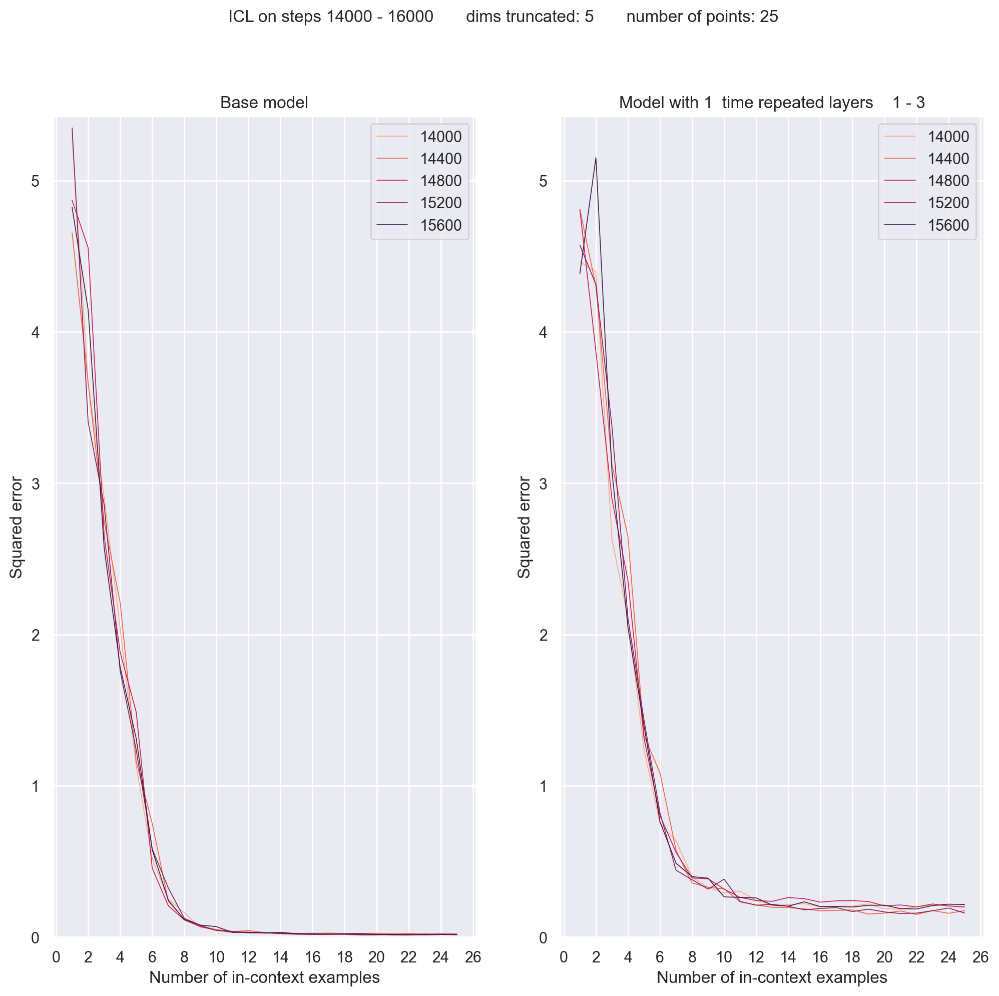

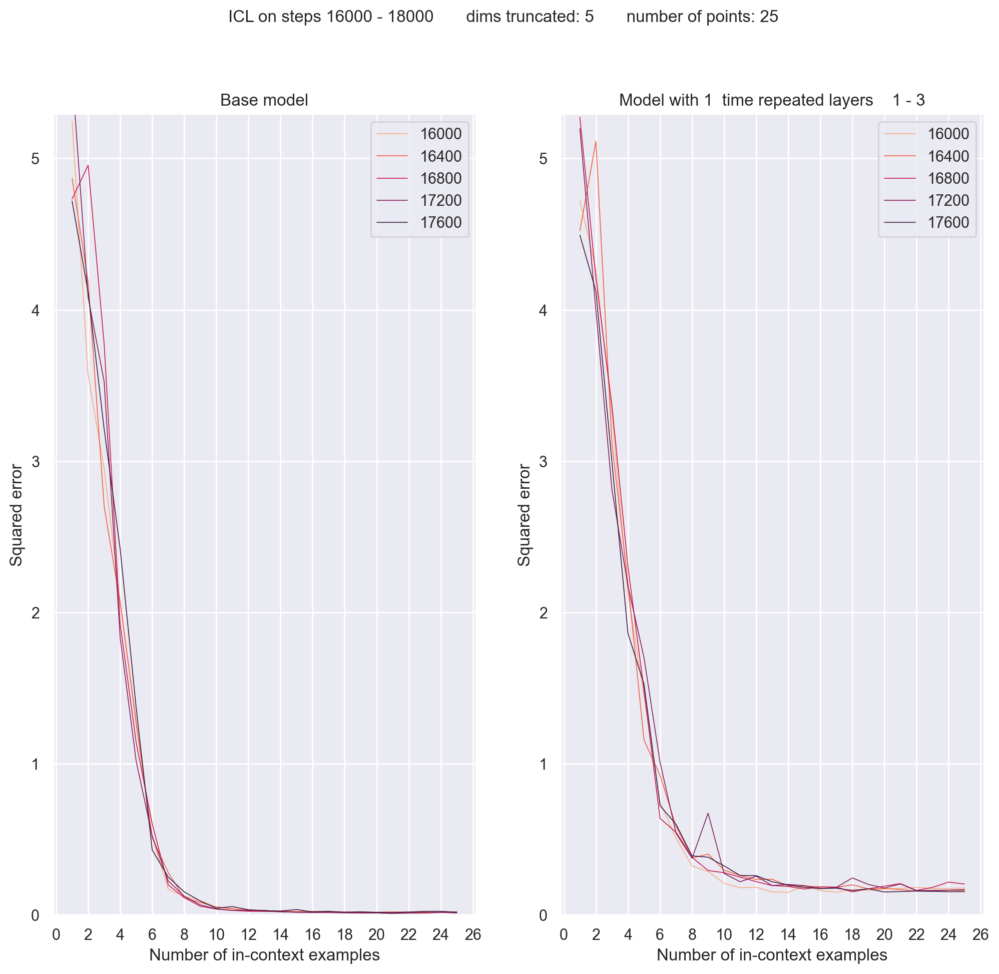

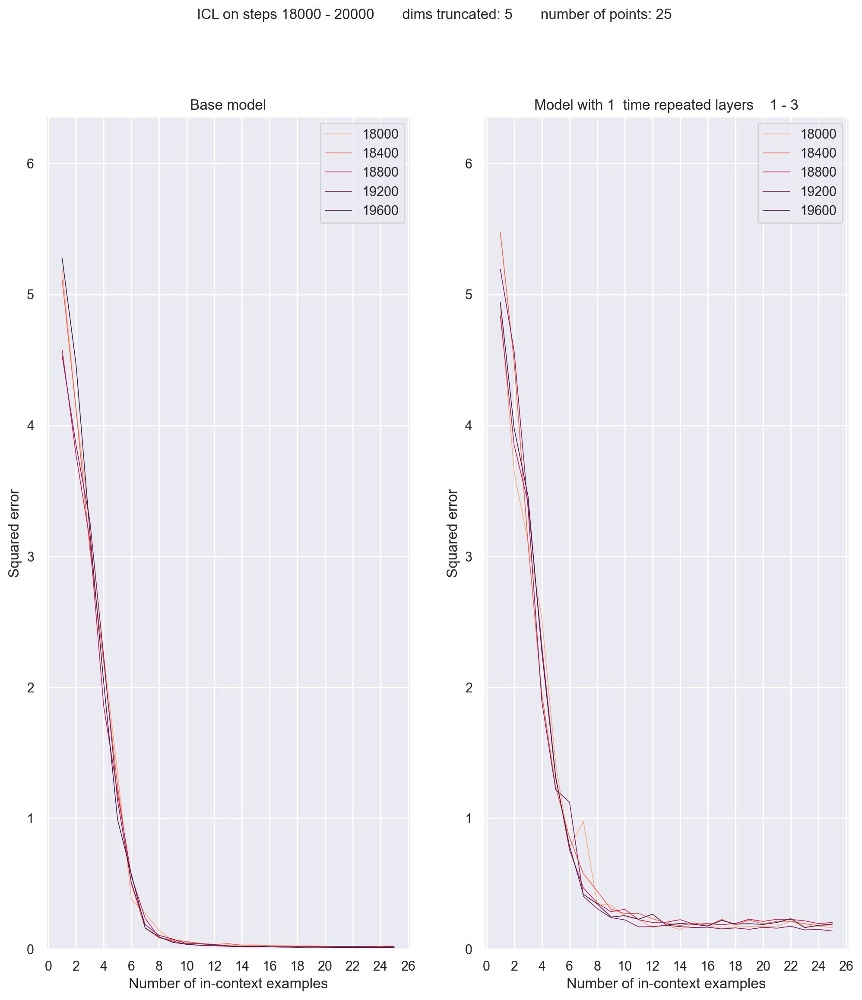

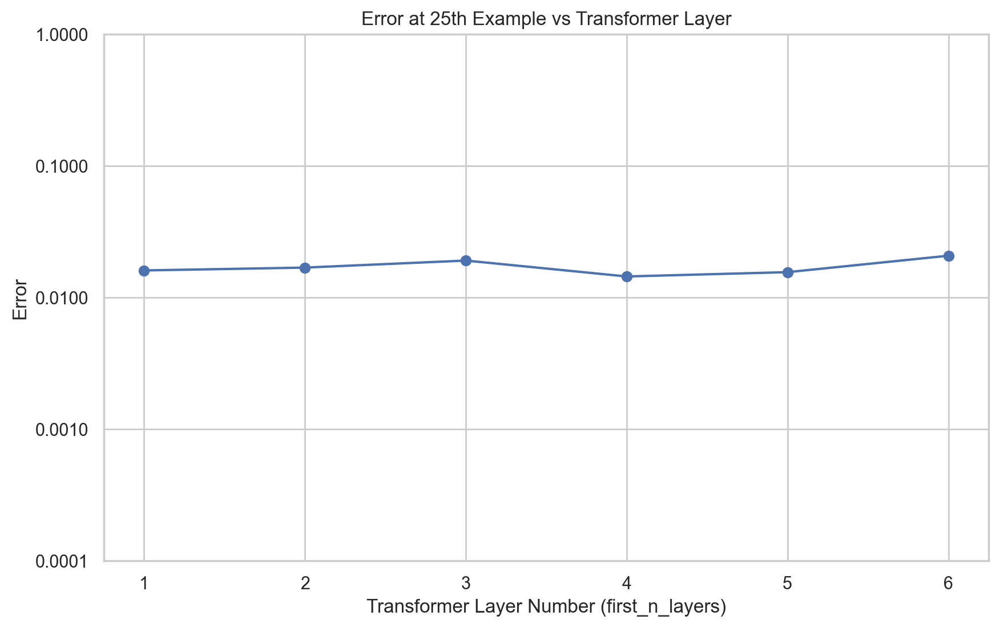

In [1]:
import torch
import matplotlib.pyplot as plt
%config InlineBackend.figure_format='retina'
from configurations import build_conf
from clean_logs_tool import clean_dirs_by_name


device = 'cuda' if torch.cuda.is_available() else 'cpu'


from quinine import Quinfig
from schema import schema
from experiments import Experiment


config_path = './configs/main.yaml'  # specify your config file path here

conf = Quinfig(config_path=config_path, schema=schema)
#conf = build_conf(conf)


#Experiment.yaml_experiment_info(conf)

"""
Выведем дефолтные конфигурации эксперимента
По умолчанию transform_func и auto_transform_func это первые элементы списков transform_variants и auto_transform_variants
transform преобразования делают измененную копию модели, для нее строится 2 график каждый eval цикл, обычно копия модели не учится
auto transform меняет основную модель - нас интересует перемешивание слоев, но можно делать и другие любые преобразования
"""



import yaml
short_name = 'permute_rnn_duplicate_baseline'
update = """
new_backbone_training: False
full_backbone_copy: True
diverge_new_backbone_training: False
readout2_training: True
permute_model: True
"""
update = yaml.safe_load(update)

clean_dirs_by_name(conf.out_dir, short_name)   
exp3 = Experiment(conf, short_name = short_name)
exp3.customize_experiment(update=update)
wandb_run = exp3.run_experiment()